Semi-Supervised Learning GAN - MNIST dataset

In [3]:
%tensorflow_version 1.5
import tensorflow
print(tensorflow.__version__)
import warnings
warnings.simplefilter("ignore")

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.5`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.
1.15.2


In [0]:
import numpy as np
import time
import os

import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data

from matplotlib import pyplot as plt
%matplotlib inline

# Nouvelle section

Initialization

In [0]:
x_height, x_width = [28, 28]
num_channels = 1
num_classes = 10
latent_size = 100
labeled_rate = 0.01

log_path = './SSL_GAN_log.csv'
model_path ='./SSL_GAN_model.ckpt'

Prepare Data

In [0]:
def normalize(x):
    # normalize data
    x = (x - 127.5) / 127.5
    return x.reshape((-1, x_height, x_width, 1))

In [0]:
 def get_data():
    # MNIST data
    mnist_data = input_data.read_data_sets('mnist_data', one_hot = True)
    return mnist_data

Build Model

In [0]:
def D(x, dropout_rate, is_training, reuse = True, print_summary = True):
    # discriminator (x -> n + 1 class)

    with tf.variable_scope('Discriminator', reuse = reuse) as scope:
        # layer1 - do not use Batch Normalization on the first layer of Discriminator
        conv1 = tf.layers.conv2d(x, 32, [5, 5],
                                 strides = [2, 2],
                                 padding = 'same')
        lrelu1 = tf.maximum(0.2 * conv1, conv1) #leaky relu
        dropout1 = tf.layers.dropout(lrelu1, dropout_rate)

        # layer2
        conv2 = tf.layers.conv2d(dropout1, 64, [3, 3],
                                 strides = [2, 2],
                                 padding = 'same')
        batch_norm2 = tf.layers.batch_normalization(conv2, training = is_training)
        lrelu2 = tf.maximum(0.2 * batch_norm2, batch_norm2)

        # layer3
        conv3 = tf.layers.conv2d(lrelu2, 128, [2, 2],
                                 strides = [2, 2],
                                 padding = 'same')
        batch_norm3 = tf.layers.batch_normalization(conv3, training = is_training)
        lrelu3 = tf.maximum(0.2 * batch_norm3, batch_norm3)
        dropout3 = tf.layers.dropout(lrelu3, dropout_rate)

        # layer 4
        conv4 = tf.layers.conv2d(dropout3, 128, [2, 2],
                                 strides = [2, 2],
                                 padding = 'same')
        # do not use batch_normalization on this layer - next layer, "flatten5",
        # will be used for "Feature Matching"
        lrelu4 = tf.maximum(0.2 * conv4, conv4)

        # layer 5
        flatten_length = lrelu4.get_shape().as_list()[1] * \
                         lrelu4.get_shape().as_list()[2] * lrelu4.get_shape().as_list()[3]
        flatten5 = tf.reshape(lrelu4, (-1, flatten_length)) # used for "Feature Matching" 
        fc5 = tf.layers.dense(flatten5, (num_classes + 1))
        output = tf.nn.softmax(fc5)

        assert output.get_shape()[1:] == [num_classes + 1]

        if print_summary:
            print('Discriminator summary:\n x: %s\n' \
                  ' D1: %s\n D2: %s\n D3: %s\n D4: %s\n' %(x.get_shape(), 
                                                           dropout1.get_shape(),
                                                           lrelu2.get_shape(), 
                                                           dropout3.get_shape(),
                                                           lrelu4.get_shape()))
        return flatten5, fc5, output

In [0]:
def G(z, is_training, reuse = False, print_summary = False):
    # generator (z -> x)

    with tf.variable_scope('Generator', reuse = reuse) as scope:
        # layer 0
        z_reshaped = tf.reshape(z, [-1, 1, 1, latent_size])

        # layer 1
        deconv1 = tf.layers.conv2d_transpose(z_reshaped,
                                             filters = latent_size,
                                             kernel_size = [2, 2],
                                             strides = [1, 1],
                                             padding = 'valid')
        batch_norm1 = tf.layers.batch_normalization(deconv1, training = is_training)
        relu1 = tf.nn.relu(batch_norm1)

        # layer 2
        deconv2 = tf.layers.conv2d_transpose(relu1,
                                             filters = 64,
                                             kernel_size = [3, 3],
                                             strides = [2, 2],
                                             padding = 'valid')
        batch_norm2 = tf.layers.batch_normalization(deconv2, training = is_training)
        relu2 = tf.nn.relu(batch_norm2)

        # layer 3
        deconv3 = tf.layers.conv2d_transpose(relu2,
                                             filters = 32,
                                             kernel_size = [4, 4],
                                             strides = [2, 2],
                                             padding = 'valid')
        batch_norm3 = tf.layers.batch_normalization(deconv3, training = is_training)
        relu3 = tf.nn.relu(batch_norm3)

        # layer 4 - do not use Batch Normalization on the last layer of Generator
        deconv4 = tf.layers.conv2d_transpose(relu3,
                                             filters = num_channels,
                                             kernel_size = [6, 6],
                                             strides = [2, 2],
                                             padding = 'valid')
        tanh4 = tf.tanh(deconv4)

        assert tanh4.get_shape()[1:] == [x_height, x_width, num_channels]
        if print_summary:
            print('Generator summary:\n z: %s\n' \
                  ' G0: %s\n G1: %s\n G2: %s\n G3: %s\n G4: %s\n' %(z.get_shape(),
                                                                    z_reshaped.get_shape(),
                                                                    relu1.get_shape(),
                                                                    relu2.get_shape(),
                                                                    relu3.get_shape(),
                                                                    tanh4.get_shape()))
        return tanh4

In [0]:
def build_model(x_real, z, label, dropout_rate, is_training, print_summary = False):
    # build model
    D_real_features, D_real_logit, D_real_prob = D(x_real, dropout_rate, is_training,
                                                   reuse = False, print_summary = print_summary)
    x_fake = G(z, is_training, reuse = False, print_summary = print_summary)
    D_fake_features, D_fake_logit, D_fake_prob = D(x_fake, dropout_rate, is_training,
                                                   reuse = True, print_summary = print_summary)

    return D_real_features, D_real_logit, D_real_prob, D_fake_features, D_fake_logit, D_fake_prob, x_fake

In [0]:
def prepare_labels(label):
    # add extra label for fake data
    extended_label = tf.concat([label, tf.zeros([tf.shape(label)[0], 1])], axis = 1)

    return extended_label

In [0]:
def loss_accuracy(D_real_features, D_real_logit, D_real_prob, D_fake_features,
                  D_fake_logit, D_fake_prob, extended_label, labeled_mask):
    epsilon = 1e-8 # used to avoid NAN loss
    # *** Discriminator loss ***
    # supervised loss
    # which class the real data belongs to
    tmp = tf.nn.softmax_cross_entropy_with_logits(logits = D_real_logit,
                                                  labels = extended_label)
    D_L_supervised = tf.reduce_sum(labeled_mask * tmp) / tf.reduce_sum(labeled_mask) # to ignore
                                                                                     # unlabeled
                                                                                     # data

    # unsupervised loss
    # data is real
    prob_real_be_real = 1 - D_real_prob[:, -1] + epsilon
    tmp_log = tf.log(prob_real_be_real)
    D_L_unsupervised1 = -1 * tf.reduce_mean(tmp_log)

    # data is fake
    prob_fake_be_fake = D_fake_prob[:, -1] + epsilon
    tmp_log = tf.log(prob_fake_be_fake)
    D_L_unsupervised2 = -1 * tf.reduce_mean(tmp_log)

    D_L = D_L_supervised + D_L_unsupervised1 + D_L_unsupervised2

    # *** Generator loss ***
    # fake data is mistaken to be real
    prob_fake_be_real = 1 - D_fake_prob[:, -1] + epsilon
    tmp_log =  tf.log(prob_fake_be_real)
    G_L1 = -1 * tf.reduce_mean(tmp_log)

    # Feature Maching
    tmp1 = tf.reduce_mean(D_real_features, axis = 0)
    tmp2 = tf.reduce_mean(D_fake_features, axis = 0)
    G_L2 = tf.reduce_mean(tf.square(tmp1 - tmp2))

    G_L = G_L1 + G_L2

    # accuracy
    correct_prediction = tf.equal(tf.argmax(D_real_prob[:, :-1], 1),
                                  tf.argmax(extended_label[:, :-1], 1))
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

    return D_L_supervised, D_L_unsupervised1, D_L_unsupervised2, D_L, G_L, accuracy

In [0]:
def optimizer(D_Loss, G_Loss, D_learning_rate, G_learning_rate):
    # D and G optimizer
    extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(extra_update_ops):
        all_vars = tf.trainable_variables()
        D_vars = [var for var in all_vars if var.name.startswith('Discriminator')]
        G_vars = [var for var in all_vars if var.name.startswith('Generator')]

        D_optimizer = tf.train.AdamOptimizer(D_learning_rate).minimize(D_Loss, var_list = D_vars)
        G_optimizer = tf.train.AdamOptimizer(G_learning_rate).minimize(G_Loss, var_list = G_vars)
        return D_optimizer, G_optimizer

Visualize

In [0]:
def plot_fake_data(data, grid_size = [5, 5]):
    # visualize some data generated by G
    _, axes = plt.subplots(figsize = grid_size, nrows = grid_size[0], ncols = grid_size[1],
                           sharey = True, sharex = True)

    size = grid_size[0] * grid_size[1]
    index = np.int_(np.random.uniform(0, data.shape[0], size = (size)))
    figs = data[index].reshape(-1, x_height, x_width)

    for idx, ax in enumerate(axes.flatten()):
        ax.axis('off')
        ax.imshow(figs[idx], cmap = 'gray')
    plt.tight_layout()
    plt.show()

Train Model

In [0]:
def save_model_on_imporvemnet(file_path, sess, cv_acc, cv_accs):
  #  # save model when there is improvemnet in cv_acc value
    if cv_accs == [] or cv_acc > np.max(cv_accs):
        saver = tf.train.Saver(max_to_keep = 1)
        saver.save(sess, file_path)
        print('Model saved')
    print('')

In [0]:
def get_labled_mask(labeled_rate, batch_size):
    # get labeled mask to mask some data unlabeled
    labeled_mask = np.zeros([batch_size], dtype = np.float32)
    labeled_count = np.int(batch_size * labeled_rate)
    labeled_mask[range(labeled_count)] = 1.0
    #np.random.shuffle(labeled_mask)

    return labeled_mask

In [0]:
def log_loss_acc(file_path, epoch, train_loss_D, train_loss_G, train_Acc,
                 cv_loss_D, cv_loss_G, cv_Acc, log_mode = 'a'):
    # log train and cv losses as well as accuracy
    mode = log_mode if epoch == 0 else 'a'

    with open(file_path, mode) as f:
        if mode == 'w':
            header = 'epoch, train_loss_D, train_loss_G,' \
                     'train_Acc, cv_loss_D, cv_loss_G, cv_Acc\n'
            f.write(header)

        line = '%d, %f, %f, %f, %f, %f, %f\n' %(epoch, train_loss_D, train_loss_G, train_Acc,
                                                cv_loss_D, cv_loss_G, cv_Acc)
        f.write(line)

In [0]:
def train_SSL_GAN(batch_size, epochs):
    # train Semi-Supervised Learning GAN
    train_D_losses, train_G_losses, train_Accs = [], [], []
    cv_D_losses, cv_G_losses, cv_Accs = [], [], []

    tf.reset_default_graph()

    x = tf.placeholder(tf.float32, name = 'x', shape = [None, x_height, x_width, num_channels])
    label = tf.placeholder(tf.float32, name = 'label', shape = [None, num_classes])
    labeled_mask = tf.placeholder(tf.float32, name = 'labeled_mask', shape = [None])
    z = tf.placeholder(tf.float32, name = 'z', shape = [None, latent_size])
    dropout_rate = tf.placeholder(tf.float32, name = 'dropout_rate')
    is_training = tf.placeholder(tf.bool, name = 'is_training')
    G_learning_rate = tf.placeholder(tf.float32, name = 'G_learning_rate')
    D_learning_rate = tf.placeholder(tf.float32, name = 'D_learning_rate')

    model = build_model(x, z, label, dropout_rate, is_training, print_summary = True)
    D_real_features, D_real_logit, D_real_prob, D_fake_features, D_fake_logit, D_fake_prob, fake_data = model
    extended_label = prepare_labels(label)
    loss_acc  = loss_accuracy(D_real_features, D_real_logit, D_real_prob,
                              D_fake_features, D_fake_logit, D_fake_prob,
                              extended_label, labeled_mask)
    _, _, _, D_L, G_L, accuracy = loss_acc
    D_optimizer, G_optimizer = optimizer(D_L, G_L, G_learning_rate, D_learning_rate)

    print('training....')

    with tf.Session() as sess:       
        sess.run(tf.global_variables_initializer())
        mnist_set = get_data()

        for epoch in range(epochs):
            t_total = 0
            for iter in range(int(mnist_set.train.images.shape[0] / batch_size) + 1):
                t_start = time.time()
                batch = mnist_set.train.next_batch(batch_size, shuffle = False)
                batch_z = np.random.uniform(-1.0, 1.0, size = (batch_size, latent_size))
                mask = get_labled_mask(labeled_rate, batch_size)
                train_feed_dictionary = {x:  normalize(batch[0]),
                                         z: batch_z,
                                         label: batch[1],
                                         labeled_mask: mask,
                                         dropout_rate: 0.5,
                                         G_learning_rate: 1e-5,
                                         D_learning_rate: 1e-5,
                                         is_training: True}

                D_optimizer.run(feed_dict = train_feed_dictionary)
                G_optimizer.run(feed_dict = train_feed_dictionary)

                train_D_loss = D_L.eval(feed_dict = train_feed_dictionary)
                train_G_loss = G_L.eval(feed_dict = train_feed_dictionary)
                train_accuracy = accuracy.eval(feed_dict = train_feed_dictionary)
                t_total += (time.time() - t_start)

                print('epoch: %d, time: %f | train_G_Loss: %f, ' \
                      'train_D_loss: %f, train_acc: %f' %(epoch, t_total,
                                                          train_G_loss, train_D_loss,
                                                          train_accuracy), end = '\r')
            train_D_losses.append(train_D_loss)
            train_G_losses.append(train_G_loss)
            train_Accs.append(train_accuracy)

            # Cross-Validation
            cv_size = mnist_set.test.labels.shape[0]
            cv_batch_z = np.random.uniform(-1.0, 1.0, size = (cv_size, latent_size))
            mask = get_labled_mask(1, cv_size)
            cv_feed_dictionary = {x: normalize(mnist_set.test.images),
                                  z: cv_batch_z,
                                  label: mnist_set.test.labels,
                                  labeled_mask: mask,
                                  dropout_rate: 0.0,
                                  is_training: False}

            cv_D_loss = D_L.eval(feed_dict = cv_feed_dictionary)
            cv_G_loss = G_L.eval(feed_dict = cv_feed_dictionary)
            cv_accuracy = accuracy.eval(feed_dict = cv_feed_dictionary)

            log_loss_acc(log_path, epoch, train_D_loss, train_G_loss, train_accuracy,
                         cv_D_loss, cv_G_loss, cv_accuracy, log_mode = 'w')
            
            save_model_on_imporvemnet(model_path, sess, cv_accuracy, cv_Accs)
            cv_D_losses.append(cv_D_loss)
            cv_G_losses.append(cv_G_loss)
            cv_Accs.append(cv_accuracy)
            print('\epoch %f , ncv_G_Loss: %f, cv_D_loss: %f, cv_acc: %f' %(epoch ,cv_G_loss,
                                                                 cv_D_loss,
                                                                 cv_accuracy))

            if epoch % 10 == 0:
                fakes = fake_data.eval(feed_dict = cv_feed_dictionary)
                plot_fake_data(fakes, [5, 5])
                
    return train_D_losses, train_G_losses, train_Accs, cv_D_losses, cv_G_losses, cv_Accs

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use keras.layers.dropout instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.batch_normalization` documentation).
Instructions for updating:
Use keras.layers.Dense instead.
Discriminator summary:
 x: (?, 28, 28, 1)
 D1: (?, 14, 14, 32)
 D2: (?, 7, 7, 64)
 D3: (?, 4, 4, 128)
 D4: (?, 2, 2, 128)

Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
Generator summary:
 z: (?, 100)
 G0: (?, 1, 1, 100)
 G1: (?, 2, 2, 100)
 G2: (?, 5, 5, 64)
 G3: (?, 12, 12, 32)
 G4: (?, 28, 28, 1)

Discriminator summary:
 x: (?, 28, 28, 1)
 D1: (?, 14, 14, 32)
 D2: (?, 7, 7, 64)
 D3: (?, 4, 4, 128)
 D4: (?, 2, 2, 128)

Instructions for updating:

Future major versions of TensorFlow wi

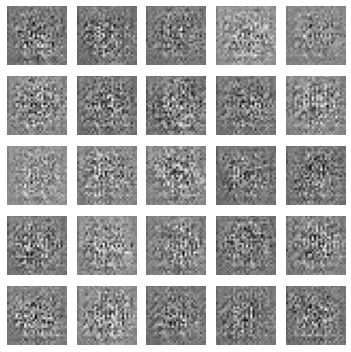

Model saved

\epoch 1.000000 , ncv_G_Loss: 1.819519, cv_D_loss: 3.572115, cv_acc: 0.098000

\epoch 2.000000 , ncv_G_Loss: 2.593541, cv_D_loss: 4.094274, cv_acc: 0.085100

\epoch 3.000000 , ncv_G_Loss: 2.815086, cv_D_loss: 6.035710, cv_acc: 0.098000
Model saved

\epoch 4.000000 , ncv_G_Loss: 3.325860, cv_D_loss: 8.012723, cv_acc: 0.101000

\epoch 5.000000 , ncv_G_Loss: 4.226108, cv_D_loss: 8.936115, cv_acc: 0.101000

\epoch 6.000000 , ncv_G_Loss: 4.537007, cv_D_loss: 9.510319, cv_acc: 0.098000

\epoch 7.000000 , ncv_G_Loss: 4.846046, cv_D_loss: 10.585807, cv_acc: 0.101000

\epoch 8.000000 , ncv_G_Loss: 5.247918, cv_D_loss: 11.529820, cv_acc: 0.101000

\epoch 9.000000 , ncv_G_Loss: 5.821379, cv_D_loss: 13.277288, cv_acc: 0.101000

\epoch 10.000000 , ncv_G_Loss: 6.555443, cv_D_loss: 14.938953, cv_acc: 0.101000


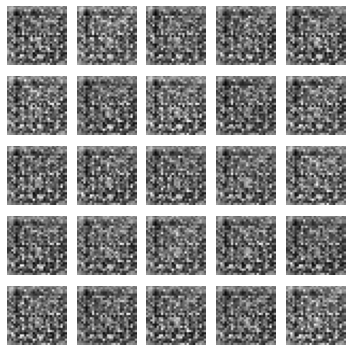


\epoch 11.000000 , ncv_G_Loss: 7.875186, cv_D_loss: 17.866776, cv_acc: 0.101000

\epoch 12.000000 , ncv_G_Loss: 9.450173, cv_D_loss: 19.824369, cv_acc: 0.101000

\epoch 13.000000 , ncv_G_Loss: 10.322836, cv_D_loss: 20.422728, cv_acc: 0.101000

\epoch 14.000000 , ncv_G_Loss: 11.175127, cv_D_loss: 21.406841, cv_acc: 0.101000

\epoch 15.000000 , ncv_G_Loss: 11.740314, cv_D_loss: 22.807661, cv_acc: 0.101000

\epoch 16.000000 , ncv_G_Loss: 11.892181, cv_D_loss: 23.537373, cv_acc: 0.101000

\epoch 17.000000 , ncv_G_Loss: 11.326830, cv_D_loss: 23.392265, cv_acc: 0.101000

\epoch 18.000000 , ncv_G_Loss: 10.565710, cv_D_loss: 23.824379, cv_acc: 0.098000

\epoch 19.000000 , ncv_G_Loss: 10.244947, cv_D_loss: 23.773878, cv_acc: 0.098000

\epoch 20.000000 , ncv_G_Loss: 9.380980, cv_D_loss: 23.159418, cv_acc: 0.097800


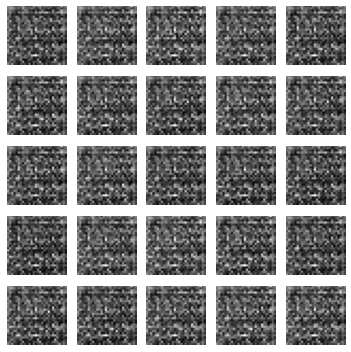


\epoch 21.000000 , ncv_G_Loss: 8.658653, cv_D_loss: 22.311148, cv_acc: 0.098000

\epoch 22.000000 , ncv_G_Loss: 7.870545, cv_D_loss: 21.024494, cv_acc: 0.098000

\epoch 23.000000 , ncv_G_Loss: 7.467552, cv_D_loss: 20.152948, cv_acc: 0.098000

\epoch 24.000000 , ncv_G_Loss: 6.534707, cv_D_loss: 20.291868, cv_acc: 0.098000

\epoch 25.000000 , ncv_G_Loss: 5.734216, cv_D_loss: 21.046644, cv_acc: 0.098000

\epoch 26.000000 , ncv_G_Loss: 5.065408, cv_D_loss: 21.313181, cv_acc: 0.098000

\epoch 27.000000 , ncv_G_Loss: 4.691046, cv_D_loss: 20.973671, cv_acc: 0.092900

\epoch 28.000000 , ncv_G_Loss: 3.929024, cv_D_loss: 19.247461, cv_acc: 0.101000

\epoch 29.000000 , ncv_G_Loss: 3.623297, cv_D_loss: 17.961866, cv_acc: 0.101000

\epoch 30.000000 , ncv_G_Loss: 3.272055, cv_D_loss: 17.004803, cv_acc: 0.101000


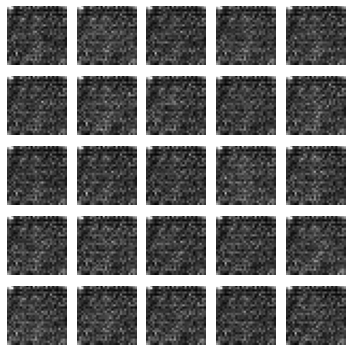


\epoch 31.000000 , ncv_G_Loss: 3.235078, cv_D_loss: 17.289099, cv_acc: 0.101000

\epoch 32.000000 , ncv_G_Loss: 2.975367, cv_D_loss: 15.730534, cv_acc: 0.101000

\epoch 33.000000 , ncv_G_Loss: 2.587406, cv_D_loss: 14.997016, cv_acc: 0.101000

\epoch 34.000000 , ncv_G_Loss: 2.242530, cv_D_loss: 15.029675, cv_acc: 0.101000

\epoch 35.000000 , ncv_G_Loss: 1.867379, cv_D_loss: 13.552552, cv_acc: 0.101000

\epoch 36.000000 , ncv_G_Loss: 1.478635, cv_D_loss: 14.531107, cv_acc: 0.101000

\epoch 37.000000 , ncv_G_Loss: 1.411148, cv_D_loss: 14.096212, cv_acc: 0.101000

\epoch 38.000000 , ncv_G_Loss: 1.376691, cv_D_loss: 12.679448, cv_acc: 0.101000

\epoch 39.000000 , ncv_G_Loss: 1.099673, cv_D_loss: 11.038660, cv_acc: 0.096000

\epoch 40.000000 , ncv_G_Loss: 0.772532, cv_D_loss: 11.139402, cv_acc: 0.101000


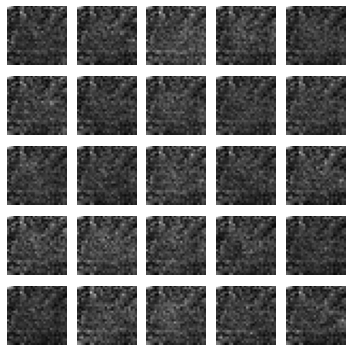


\epoch 41.000000 , ncv_G_Loss: 0.749907, cv_D_loss: 10.761985, cv_acc: 0.101000
Model saved

\epoch 42.000000 , ncv_G_Loss: 1.037063, cv_D_loss: 10.215698, cv_acc: 0.117700

\epoch 43.000000 , ncv_G_Loss: 1.049307, cv_D_loss: 10.283809, cv_acc: 0.101000

\epoch 44.000000 , ncv_G_Loss: 0.569995, cv_D_loss: 8.507381, cv_acc: 0.101000

\epoch 45.000000 , ncv_G_Loss: 0.803882, cv_D_loss: 8.669136, cv_acc: 0.108200

\epoch 46.000000 , ncv_G_Loss: 0.467198, cv_D_loss: 8.470854, cv_acc: 0.082600

\epoch 47.000000 , ncv_G_Loss: 0.730516, cv_D_loss: 8.494077, cv_acc: 0.098000
Model saved

\epoch 48.000000 , ncv_G_Loss: 0.678470, cv_D_loss: 8.085942, cv_acc: 0.141700

\epoch 49.000000 , ncv_G_Loss: 0.831151, cv_D_loss: 7.593695, cv_acc: 0.102800

\epoch 50.000000 , ncv_G_Loss: 0.920138, cv_D_loss: 9.139352, cv_acc: 0.111100


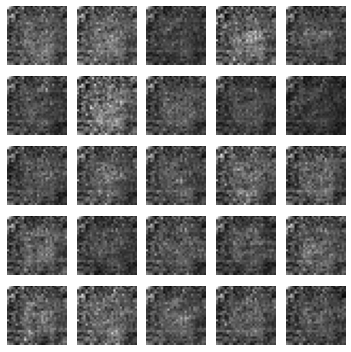


\epoch 51.000000 , ncv_G_Loss: 0.412308, cv_D_loss: 6.442349, cv_acc: 0.101000

\epoch 52.000000 , ncv_G_Loss: 0.806265, cv_D_loss: 7.621078, cv_acc: 0.100500

\epoch 53.000000 , ncv_G_Loss: 0.418255, cv_D_loss: 6.638452, cv_acc: 0.117800

\epoch 54.000000 , ncv_G_Loss: 0.560993, cv_D_loss: 6.837915, cv_acc: 0.141000
Model saved

\epoch 55.000000 , ncv_G_Loss: 0.522511, cv_D_loss: 6.535432, cv_acc: 0.192400

\epoch 56.000000 , ncv_G_Loss: 0.332441, cv_D_loss: 5.866791, cv_acc: 0.144200

\epoch 57.000000 , ncv_G_Loss: 0.466236, cv_D_loss: 5.809954, cv_acc: 0.169500

\epoch 58.000000 , ncv_G_Loss: 0.519282, cv_D_loss: 5.408373, cv_acc: 0.173000

\epoch 59.000000 , ncv_G_Loss: 0.528531, cv_D_loss: 6.039907, cv_acc: 0.191700

\epoch 60.000000 , ncv_G_Loss: 0.718838, cv_D_loss: 6.469957, cv_acc: 0.145200


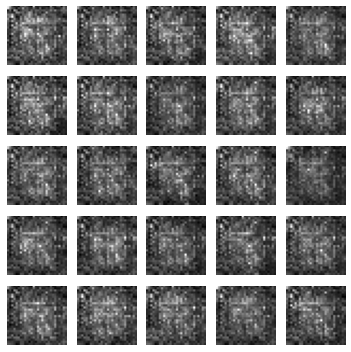


\epoch 61.000000 , ncv_G_Loss: 0.365703, cv_D_loss: 5.819322, cv_acc: 0.165600

\epoch 62.000000 , ncv_G_Loss: 0.374902, cv_D_loss: 5.306861, cv_acc: 0.113500

\epoch 63.000000 , ncv_G_Loss: 0.409888, cv_D_loss: 5.686249, cv_acc: 0.150800

\epoch 64.000000 , ncv_G_Loss: 0.974649, cv_D_loss: 6.715851, cv_acc: 0.125500

\epoch 65.000000 , ncv_G_Loss: 0.365284, cv_D_loss: 5.854341, cv_acc: 0.113500

\epoch 66.000000 , ncv_G_Loss: 0.482824, cv_D_loss: 5.279120, cv_acc: 0.101000

\epoch 67.000000 , ncv_G_Loss: 0.343136, cv_D_loss: 5.041193, cv_acc: 0.140800

\epoch 68.000000 , ncv_G_Loss: 0.205311, cv_D_loss: 5.148709, cv_acc: 0.113500

\epoch 69.000000 , ncv_G_Loss: 0.749780, cv_D_loss: 5.085875, cv_acc: 0.136400
Model saved

\epoch 70.000000 , ncv_G_Loss: 0.620546, cv_D_loss: 4.844260, cv_acc: 0.214200


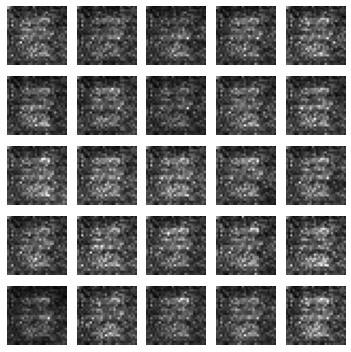


\epoch 71.000000 , ncv_G_Loss: 0.507698, cv_D_loss: 4.841644, cv_acc: 0.101000

\epoch 72.000000 , ncv_G_Loss: 0.453191, cv_D_loss: 4.807461, cv_acc: 0.115800

\epoch 73.000000 , ncv_G_Loss: 0.447194, cv_D_loss: 4.683009, cv_acc: 0.117800

\epoch 74.000000 , ncv_G_Loss: 1.253588, cv_D_loss: 5.896871, cv_acc: 0.162100

\epoch 75.000000 , ncv_G_Loss: 0.401412, cv_D_loss: 4.875340, cv_acc: 0.113500

\epoch 76.000000 , ncv_G_Loss: 0.271437, cv_D_loss: 4.802434, cv_acc: 0.114100
Model saved

\epoch 77.000000 , ncv_G_Loss: 0.301284, cv_D_loss: 4.667815, cv_acc: 0.289400

\epoch 78.000000 , ncv_G_Loss: 0.343964, cv_D_loss: 4.896832, cv_acc: 0.102900

\epoch 79.000000 , ncv_G_Loss: 0.246191, cv_D_loss: 4.746582, cv_acc: 0.125900

\epoch 80.000000 , ncv_G_Loss: 0.504255, cv_D_loss: 5.046598, cv_acc: 0.101100


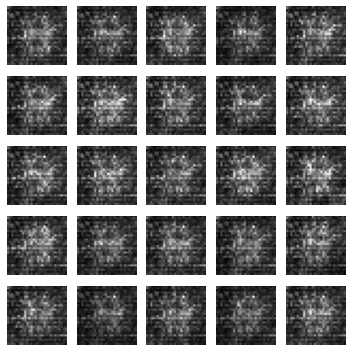


\epoch 81.000000 , ncv_G_Loss: 0.289063, cv_D_loss: 4.875153, cv_acc: 0.167200

\epoch 82.000000 , ncv_G_Loss: 0.673945, cv_D_loss: 5.344662, cv_acc: 0.153500

\epoch 83.000000 , ncv_G_Loss: 0.511790, cv_D_loss: 5.397052, cv_acc: 0.098200

\epoch 84.000000 , ncv_G_Loss: 0.332314, cv_D_loss: 4.737290, cv_acc: 0.110600

\epoch 85.000000 , ncv_G_Loss: 0.437516, cv_D_loss: 4.844936, cv_acc: 0.102900

\epoch 86.000000 , ncv_G_Loss: 0.687851, cv_D_loss: 5.398628, cv_acc: 0.095800

\epoch 87.000000 , ncv_G_Loss: 0.351083, cv_D_loss: 4.795327, cv_acc: 0.134500

\epoch 88.000000 , ncv_G_Loss: 0.702441, cv_D_loss: 5.193101, cv_acc: 0.095900

\epoch 89.000000 , ncv_G_Loss: 0.499819, cv_D_loss: 4.784440, cv_acc: 0.095800

\epoch 90.000000 , ncv_G_Loss: 0.607397, cv_D_loss: 4.995872, cv_acc: 0.189800


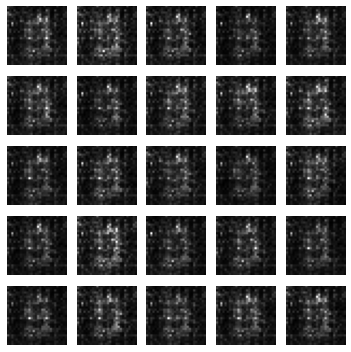


\epoch 91.000000 , ncv_G_Loss: 0.419802, cv_D_loss: 4.570851, cv_acc: 0.189900

\epoch 92.000000 , ncv_G_Loss: 0.370560, cv_D_loss: 4.598550, cv_acc: 0.177400

\epoch 93.000000 , ncv_G_Loss: 0.359445, cv_D_loss: 4.495162, cv_acc: 0.206200

\epoch 94.000000 , ncv_G_Loss: 0.731004, cv_D_loss: 4.813691, cv_acc: 0.204300

\epoch 95.000000 , ncv_G_Loss: 0.405340, cv_D_loss: 4.558887, cv_acc: 0.236400

\epoch 96.000000 , ncv_G_Loss: 0.484681, cv_D_loss: 4.793072, cv_acc: 0.120500

\epoch 97.000000 , ncv_G_Loss: 0.608513, cv_D_loss: 4.758101, cv_acc: 0.120900

\epoch 98.000000 , ncv_G_Loss: 0.573002, cv_D_loss: 4.763391, cv_acc: 0.210100

\epoch 99.000000 , ncv_G_Loss: 0.636129, cv_D_loss: 4.858593, cv_acc: 0.152100

\epoch 100.000000 , ncv_G_Loss: 0.395359, cv_D_loss: 4.468014, cv_acc: 0.239100


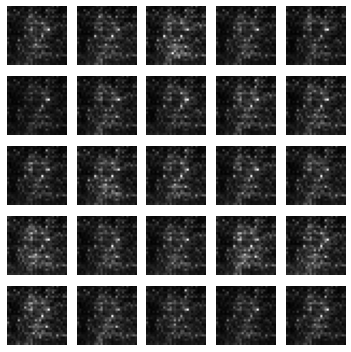


\epoch 101.000000 , ncv_G_Loss: 0.657098, cv_D_loss: 4.618220, cv_acc: 0.212500

\epoch 102.000000 , ncv_G_Loss: 0.683263, cv_D_loss: 4.681190, cv_acc: 0.206800

\epoch 103.000000 , ncv_G_Loss: 0.199379, cv_D_loss: 4.624285, cv_acc: 0.134500

\epoch 104.000000 , ncv_G_Loss: 0.456287, cv_D_loss: 4.678746, cv_acc: 0.160000

\epoch 105.000000 , ncv_G_Loss: 0.219962, cv_D_loss: 4.547224, cv_acc: 0.147400

\epoch 106.000000 , ncv_G_Loss: 0.361066, cv_D_loss: 4.665932, cv_acc: 0.240200

\epoch 107.000000 , ncv_G_Loss: 0.922396, cv_D_loss: 4.858640, cv_acc: 0.215900

\epoch 108.000000 , ncv_G_Loss: 0.252620, cv_D_loss: 4.618565, cv_acc: 0.116300

\epoch 109.000000 , ncv_G_Loss: 0.817058, cv_D_loss: 4.654593, cv_acc: 0.106300
Model saved

\epoch 110.000000 , ncv_G_Loss: 0.630036, cv_D_loss: 4.431846, cv_acc: 0.302100


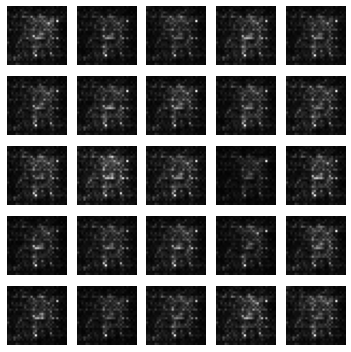


\epoch 111.000000 , ncv_G_Loss: 1.070826, cv_D_loss: 5.201067, cv_acc: 0.153800

\epoch 112.000000 , ncv_G_Loss: 0.545860, cv_D_loss: 4.426949, cv_acc: 0.247600

\epoch 113.000000 , ncv_G_Loss: 0.593807, cv_D_loss: 4.511278, cv_acc: 0.162900

\epoch 114.000000 , ncv_G_Loss: 0.626624, cv_D_loss: 4.576239, cv_acc: 0.168200
Model saved

\epoch 115.000000 , ncv_G_Loss: 0.842363, cv_D_loss: 4.616083, cv_acc: 0.365000

\epoch 116.000000 , ncv_G_Loss: 0.759777, cv_D_loss: 4.577767, cv_acc: 0.165600

\epoch 117.000000 , ncv_G_Loss: 0.303449, cv_D_loss: 4.388247, cv_acc: 0.209700
Model saved

\epoch 118.000000 , ncv_G_Loss: 0.410081, cv_D_loss: 4.359358, cv_acc: 0.401900

\epoch 119.000000 , ncv_G_Loss: 0.241024, cv_D_loss: 4.405744, cv_acc: 0.119000

\epoch 120.000000 , ncv_G_Loss: 0.865737, cv_D_loss: 4.703838, cv_acc: 0.247300


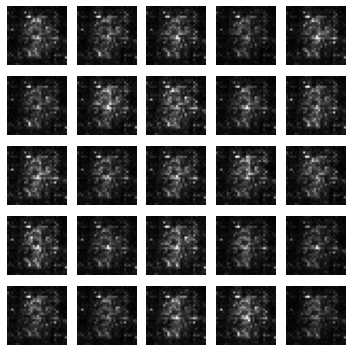


\epoch 121.000000 , ncv_G_Loss: 0.825259, cv_D_loss: 4.583128, cv_acc: 0.319200

\epoch 122.000000 , ncv_G_Loss: 1.058475, cv_D_loss: 5.041976, cv_acc: 0.184100

\epoch 123.000000 , ncv_G_Loss: 0.294361, cv_D_loss: 4.246972, cv_acc: 0.312900

\epoch 124.000000 , ncv_G_Loss: 0.401814, cv_D_loss: 4.098337, cv_acc: 0.278400

\epoch 125.000000 , ncv_G_Loss: 0.400169, cv_D_loss: 4.239369, cv_acc: 0.276300

\epoch 126.000000 , ncv_G_Loss: 0.281915, cv_D_loss: 4.345079, cv_acc: 0.124000
Model saved

\epoch 127.000000 , ncv_G_Loss: 0.236164, cv_D_loss: 4.340847, cv_acc: 0.414300

\epoch 128.000000 , ncv_G_Loss: 0.531802, cv_D_loss: 4.261508, cv_acc: 0.135000

\epoch 129.000000 , ncv_G_Loss: 0.367520, cv_D_loss: 4.153716, cv_acc: 0.389200

\epoch 130.000000 , ncv_G_Loss: 0.636574, cv_D_loss: 4.161954, cv_acc: 0.396300


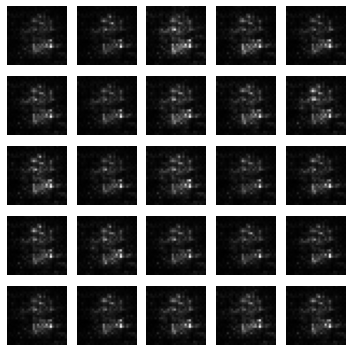

Model saved

\epoch 131.000000 , ncv_G_Loss: 0.378164, cv_D_loss: 4.183305, cv_acc: 0.427000

\epoch 132.000000 , ncv_G_Loss: 0.664002, cv_D_loss: 4.375585, cv_acc: 0.289900

\epoch 133.000000 , ncv_G_Loss: 0.379430, cv_D_loss: 4.263976, cv_acc: 0.195000

\epoch 134.000000 , ncv_G_Loss: 0.820076, cv_D_loss: 4.499056, cv_acc: 0.198500

\epoch 135.000000 , ncv_G_Loss: 0.715572, cv_D_loss: 4.473101, cv_acc: 0.289100

\epoch 136.000000 , ncv_G_Loss: 1.040929, cv_D_loss: 4.842205, cv_acc: 0.319500

\epoch 137.000000 , ncv_G_Loss: 0.592020, cv_D_loss: 4.408274, cv_acc: 0.139800

\epoch 138.000000 , ncv_G_Loss: 0.357946, cv_D_loss: 4.156006, cv_acc: 0.318300

\epoch 139.000000 , ncv_G_Loss: 0.376829, cv_D_loss: 4.150914, cv_acc: 0.241200

\epoch 140.000000 , ncv_G_Loss: 0.358983, cv_D_loss: 4.178417, cv_acc: 0.328000


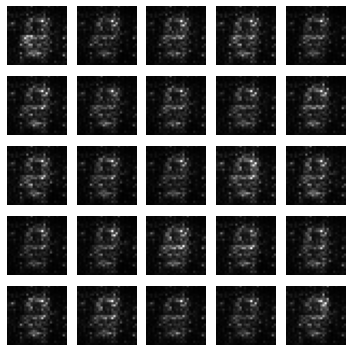


\epoch 141.000000 , ncv_G_Loss: 0.954045, cv_D_loss: 4.967577, cv_acc: 0.149600

\epoch 142.000000 , ncv_G_Loss: 0.407075, cv_D_loss: 4.221602, cv_acc: 0.131000

\epoch 143.000000 , ncv_G_Loss: 0.525980, cv_D_loss: 4.400785, cv_acc: 0.149300

\epoch 144.000000 , ncv_G_Loss: 0.370337, cv_D_loss: 4.220757, cv_acc: 0.247400

\epoch 145.000000 , ncv_G_Loss: 0.395242, cv_D_loss: 4.188369, cv_acc: 0.364400

\epoch 146.000000 , ncv_G_Loss: 0.243289, cv_D_loss: 4.243306, cv_acc: 0.205100

\epoch 147.000000 , ncv_G_Loss: 0.279685, cv_D_loss: 4.187776, cv_acc: 0.194800
Model saved

\epoch 148.000000 , ncv_G_Loss: 0.466756, cv_D_loss: 4.152410, cv_acc: 0.520400

\epoch 149.000000 , ncv_G_Loss: 0.547297, cv_D_loss: 4.231466, cv_acc: 0.292300

\epoch 150.000000 , ncv_G_Loss: 1.447976, cv_D_loss: 5.653971, cv_acc: 0.316500


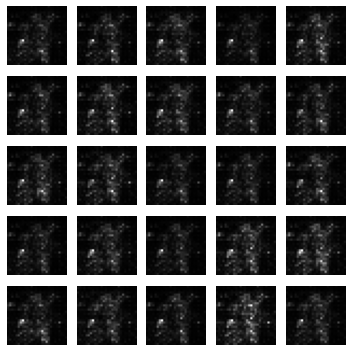


\epoch 151.000000 , ncv_G_Loss: 0.286369, cv_D_loss: 4.264450, cv_acc: 0.256300

\epoch 152.000000 , ncv_G_Loss: 0.216360, cv_D_loss: 4.262235, cv_acc: 0.244600

\epoch 153.000000 , ncv_G_Loss: 0.964161, cv_D_loss: 4.612252, cv_acc: 0.270700

\epoch 154.000000 , ncv_G_Loss: 0.509575, cv_D_loss: 4.089161, cv_acc: 0.362800

\epoch 155.000000 , ncv_G_Loss: 0.508985, cv_D_loss: 4.138466, cv_acc: 0.415900

\epoch 156.000000 , ncv_G_Loss: 0.599486, cv_D_loss: 4.329471, cv_acc: 0.301200

\epoch 157.000000 , ncv_G_Loss: 0.350145, cv_D_loss: 4.070597, cv_acc: 0.210700

\epoch 158.000000 , ncv_G_Loss: 0.396524, cv_D_loss: 4.120860, cv_acc: 0.358500

\epoch 159.000000 , ncv_G_Loss: 0.375271, cv_D_loss: 4.035592, cv_acc: 0.363400

\epoch 160.000000 , ncv_G_Loss: 0.580854, cv_D_loss: 4.188426, cv_acc: 0.240700


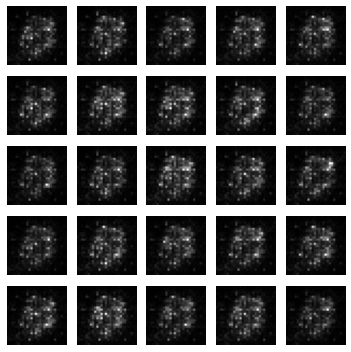


\epoch 161.000000 , ncv_G_Loss: 0.731436, cv_D_loss: 4.214411, cv_acc: 0.335300

\epoch 162.000000 , ncv_G_Loss: 0.529751, cv_D_loss: 4.103013, cv_acc: 0.300600

\epoch 163.000000 , ncv_G_Loss: 0.321971, cv_D_loss: 4.031567, cv_acc: 0.390600

\epoch 164.000000 , ncv_G_Loss: 0.852199, cv_D_loss: 4.492277, cv_acc: 0.154600

\epoch 165.000000 , ncv_G_Loss: 0.450237, cv_D_loss: 3.990469, cv_acc: 0.305900

\epoch 166.000000 , ncv_G_Loss: 1.120812, cv_D_loss: 4.825994, cv_acc: 0.426000

\epoch 167.000000 , ncv_G_Loss: 0.237415, cv_D_loss: 4.085947, cv_acc: 0.465900

\epoch 168.000000 , ncv_G_Loss: 0.661108, cv_D_loss: 4.446467, cv_acc: 0.479000

\epoch 169.000000 , ncv_G_Loss: 0.286984, cv_D_loss: 4.036040, cv_acc: 0.321200

\epoch 170.000000 , ncv_G_Loss: 0.352393, cv_D_loss: 4.088706, cv_acc: 0.349600


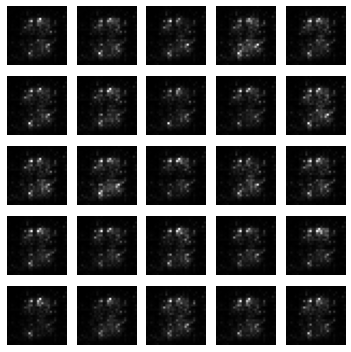


\epoch 171.000000 , ncv_G_Loss: 0.748618, cv_D_loss: 4.011883, cv_acc: 0.410000

\epoch 172.000000 , ncv_G_Loss: 0.504619, cv_D_loss: 3.978026, cv_acc: 0.394300

\epoch 173.000000 , ncv_G_Loss: 0.146392, cv_D_loss: 4.312668, cv_acc: 0.427800
Model saved

\epoch 174.000000 , ncv_G_Loss: 0.299706, cv_D_loss: 4.021470, cv_acc: 0.581500

\epoch 175.000000 , ncv_G_Loss: 0.507696, cv_D_loss: 3.800484, cv_acc: 0.366800

\epoch 176.000000 , ncv_G_Loss: 0.390789, cv_D_loss: 4.067283, cv_acc: 0.422500

\epoch 177.000000 , ncv_G_Loss: 0.694019, cv_D_loss: 4.004835, cv_acc: 0.353800

\epoch 178.000000 , ncv_G_Loss: 0.383847, cv_D_loss: 3.992365, cv_acc: 0.400700

\epoch 179.000000 , ncv_G_Loss: 0.354073, cv_D_loss: 4.049119, cv_acc: 0.532700

\epoch 180.000000 , ncv_G_Loss: 0.241687, cv_D_loss: 4.035309, cv_acc: 0.388200


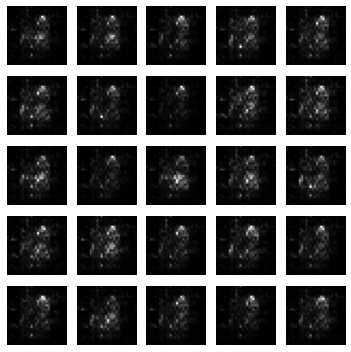


\epoch 181.000000 , ncv_G_Loss: 0.527358, cv_D_loss: 4.101587, cv_acc: 0.270900

\epoch 182.000000 , ncv_G_Loss: 0.265228, cv_D_loss: 3.943692, cv_acc: 0.432000

\epoch 183.000000 , ncv_G_Loss: 0.433336, cv_D_loss: 3.978269, cv_acc: 0.480100

\epoch 184.000000 , ncv_G_Loss: 0.512958, cv_D_loss: 3.855206, cv_acc: 0.401600

\epoch 185.000000 , ncv_G_Loss: 0.661268, cv_D_loss: 4.134993, cv_acc: 0.306200

\epoch 186.000000 , ncv_G_Loss: 0.272560, cv_D_loss: 3.926682, cv_acc: 0.457800

\epoch 187.000000 , ncv_G_Loss: 0.734302, cv_D_loss: 4.168373, cv_acc: 0.508100

\epoch 188.000000 , ncv_G_Loss: 0.359543, cv_D_loss: 3.866973, cv_acc: 0.484000

\epoch 189.000000 , ncv_G_Loss: 0.520929, cv_D_loss: 3.810687, cv_acc: 0.363500
Model saved

\epoch 190.000000 , ncv_G_Loss: 0.648185, cv_D_loss: 3.866316, cv_acc: 0.608900


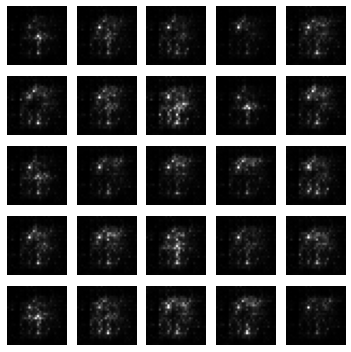


\epoch 191.000000 , ncv_G_Loss: 0.428425, cv_D_loss: 3.674265, cv_acc: 0.521600

\epoch 192.000000 , ncv_G_Loss: 0.403591, cv_D_loss: 3.744127, cv_acc: 0.490500

\epoch 193.000000 , ncv_G_Loss: 0.748971, cv_D_loss: 3.950910, cv_acc: 0.475400

\epoch 194.000000 , ncv_G_Loss: 0.384693, cv_D_loss: 3.700276, cv_acc: 0.444500

\epoch 195.000000 , ncv_G_Loss: 0.436711, cv_D_loss: 3.796163, cv_acc: 0.591000

\epoch 196.000000 , ncv_G_Loss: 0.972048, cv_D_loss: 4.093772, cv_acc: 0.503100

\epoch 197.000000 , ncv_G_Loss: 0.700127, cv_D_loss: 3.821705, cv_acc: 0.559500

\epoch 198.000000 , ncv_G_Loss: 0.778544, cv_D_loss: 3.971629, cv_acc: 0.452900

\epoch 199.000000 , ncv_G_Loss: 0.426974, cv_D_loss: 3.760382, cv_acc: 0.413100

\epoch 200.000000 , ncv_G_Loss: 0.865389, cv_D_loss: 4.165225, cv_acc: 0.514000


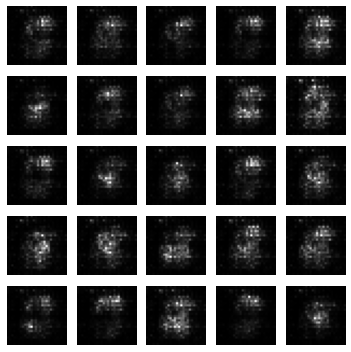


\epoch 201.000000 , ncv_G_Loss: 0.297288, cv_D_loss: 3.747442, cv_acc: 0.517800

\epoch 202.000000 , ncv_G_Loss: 0.349037, cv_D_loss: 3.932643, cv_acc: 0.254200

\epoch 203.000000 , ncv_G_Loss: 1.983047, cv_D_loss: 5.851443, cv_acc: 0.532600

\epoch 204.000000 , ncv_G_Loss: 0.507921, cv_D_loss: 3.722038, cv_acc: 0.505100

\epoch 205.000000 , ncv_G_Loss: 0.232607, cv_D_loss: 3.786216, cv_acc: 0.437300

\epoch 206.000000 , ncv_G_Loss: 0.706565, cv_D_loss: 4.216975, cv_acc: 0.246200

\epoch 207.000000 , ncv_G_Loss: 0.691119, cv_D_loss: 3.911624, cv_acc: 0.371000

\epoch 208.000000 , ncv_G_Loss: 0.159701, cv_D_loss: 3.964956, cv_acc: 0.595100

\epoch 209.000000 , ncv_G_Loss: 0.283097, cv_D_loss: 3.805387, cv_acc: 0.477200

\epoch 210.000000 , ncv_G_Loss: 0.613834, cv_D_loss: 3.689860, cv_acc: 0.531900


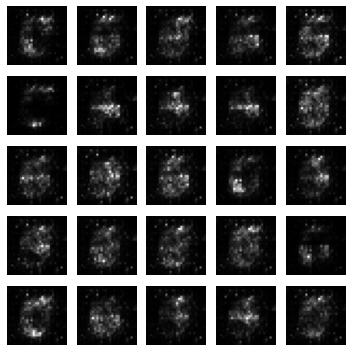

Model saved

\epoch 211.000000 , ncv_G_Loss: 0.319313, cv_D_loss: 3.634918, cv_acc: 0.670500

\epoch 212.000000 , ncv_G_Loss: 0.220398, cv_D_loss: 3.803092, cv_acc: 0.641200

\epoch 213.000000 , ncv_G_Loss: 0.241334, cv_D_loss: 3.776313, cv_acc: 0.626800

\epoch 214.000000 , ncv_G_Loss: 0.385573, cv_D_loss: 3.587478, cv_acc: 0.434500

\epoch 215.000000 , ncv_G_Loss: 0.696292, cv_D_loss: 3.724101, cv_acc: 0.629100

\epoch 216.000000 , ncv_G_Loss: 0.318894, cv_D_loss: 3.622681, cv_acc: 0.615700

\epoch 217.000000 , ncv_G_Loss: 0.305656, cv_D_loss: 3.615025, cv_acc: 0.634800

\epoch 218.000000 , ncv_G_Loss: 0.754571, cv_D_loss: 3.849267, cv_acc: 0.477500

\epoch 219.000000 , ncv_G_Loss: 0.651343, cv_D_loss: 3.771995, cv_acc: 0.567000

\epoch 220.000000 , ncv_G_Loss: 0.606193, cv_D_loss: 3.803122, cv_acc: 0.587800


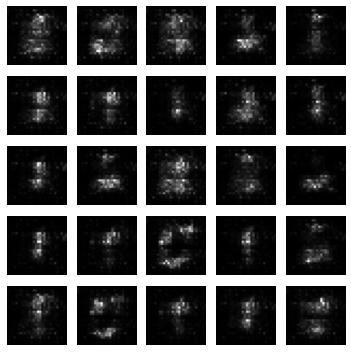


\epoch 221.000000 , ncv_G_Loss: 0.767025, cv_D_loss: 3.947968, cv_acc: 0.417300

\epoch 222.000000 , ncv_G_Loss: 0.312909, cv_D_loss: 3.578804, cv_acc: 0.499700

\epoch 223.000000 , ncv_G_Loss: 0.417514, cv_D_loss: 3.554232, cv_acc: 0.522500

\epoch 224.000000 , ncv_G_Loss: 0.491161, cv_D_loss: 3.492599, cv_acc: 0.653000

\epoch 225.000000 , ncv_G_Loss: 0.880857, cv_D_loss: 4.180290, cv_acc: 0.396000
Model saved

\epoch 226.000000 , ncv_G_Loss: 0.784708, cv_D_loss: 3.783872, cv_acc: 0.675200

\epoch 227.000000 , ncv_G_Loss: 0.332524, cv_D_loss: 3.468482, cv_acc: 0.603900

\epoch 228.000000 , ncv_G_Loss: 0.319072, cv_D_loss: 3.514100, cv_acc: 0.649800
Model saved

\epoch 229.000000 , ncv_G_Loss: 0.267722, cv_D_loss: 3.516864, cv_acc: 0.682200
Model saved

\epoch 230.000000 , ncv_G_Loss: 0.343154, cv_D_loss: 3.424415, cv_acc: 0.700300


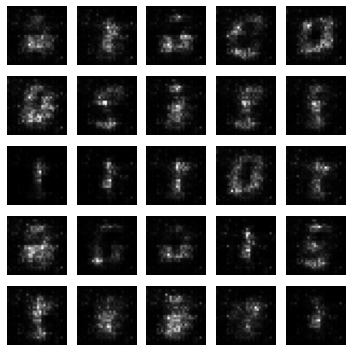


\epoch 231.000000 , ncv_G_Loss: 0.479279, cv_D_loss: 3.398924, cv_acc: 0.678500

\epoch 232.000000 , ncv_G_Loss: 0.446161, cv_D_loss: 3.539745, cv_acc: 0.469000

\epoch 233.000000 , ncv_G_Loss: 0.477947, cv_D_loss: 3.499387, cv_acc: 0.553200

\epoch 234.000000 , ncv_G_Loss: 0.770038, cv_D_loss: 3.839649, cv_acc: 0.559100

\epoch 235.000000 , ncv_G_Loss: 0.742743, cv_D_loss: 3.821121, cv_acc: 0.525900

\epoch 236.000000 , ncv_G_Loss: 0.277110, cv_D_loss: 3.523870, cv_acc: 0.553000

\epoch 237.000000 , ncv_G_Loss: 0.656691, cv_D_loss: 3.593498, cv_acc: 0.692800
Model saved

\epoch 238.000000 , ncv_G_Loss: 0.413881, cv_D_loss: 3.372633, cv_acc: 0.730600

\epoch 239.000000 , ncv_G_Loss: 0.578857, cv_D_loss: 3.431130, cv_acc: 0.664500
Model saved

\epoch 240.000000 , ncv_G_Loss: 0.400547, cv_D_loss: 3.319152, cv_acc: 0.734700


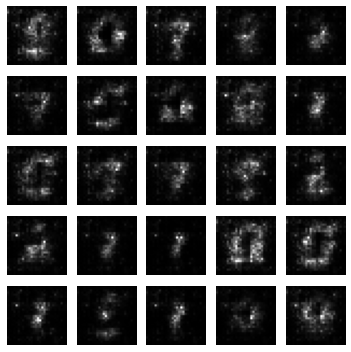

Model saved

\epoch 241.000000 , ncv_G_Loss: 0.436667, cv_D_loss: 3.309660, cv_acc: 0.738400
Model saved

\epoch 242.000000 , ncv_G_Loss: 0.758507, cv_D_loss: 3.554907, cv_acc: 0.742200

\epoch 243.000000 , ncv_G_Loss: 0.590065, cv_D_loss: 3.360161, cv_acc: 0.680000

\epoch 244.000000 , ncv_G_Loss: 0.543664, cv_D_loss: 3.527089, cv_acc: 0.516300

\epoch 245.000000 , ncv_G_Loss: 0.583009, cv_D_loss: 3.375383, cv_acc: 0.739300

\epoch 246.000000 , ncv_G_Loss: 0.594860, cv_D_loss: 3.555475, cv_acc: 0.636500

\epoch 247.000000 , ncv_G_Loss: 0.142223, cv_D_loss: 3.664474, cv_acc: 0.695300

\epoch 248.000000 , ncv_G_Loss: 0.198877, cv_D_loss: 3.531659, cv_acc: 0.712600

\epoch 249.000000 , ncv_G_Loss: 0.425243, cv_D_loss: 3.465776, cv_acc: 0.586500

\epoch 250.000000 , ncv_G_Loss: 0.364811, cv_D_loss: 3.407736, cv_acc: 0.636500


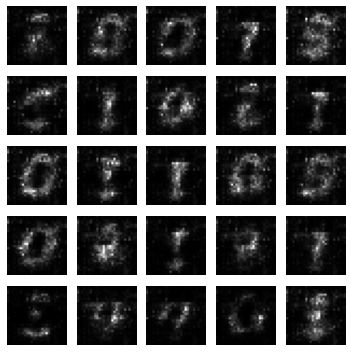


\epoch 251.000000 , ncv_G_Loss: 0.244924, cv_D_loss: 3.380330, cv_acc: 0.602800

\epoch 252.000000 , ncv_G_Loss: 0.786379, cv_D_loss: 3.851160, cv_acc: 0.542200

\epoch 253.000000 , ncv_G_Loss: 0.562686, cv_D_loss: 3.565883, cv_acc: 0.593400

\epoch 254.000000 , ncv_G_Loss: 0.523972, cv_D_loss: 3.620288, cv_acc: 0.506700

\epoch 255.000000 , ncv_G_Loss: 1.088712, cv_D_loss: 4.127297, cv_acc: 0.613400

\epoch 256.000000 , ncv_G_Loss: 0.451085, cv_D_loss: 3.228258, cv_acc: 0.718100

\epoch 257.000000 , ncv_G_Loss: 0.596182, cv_D_loss: 3.323927, cv_acc: 0.736200

\epoch 258.000000 , ncv_G_Loss: 1.440630, cv_D_loss: 4.780433, cv_acc: 0.667300
Model saved

\epoch 259.000000 , ncv_G_Loss: 0.599806, cv_D_loss: 3.297287, cv_acc: 0.755300

\epoch 260.000000 , ncv_G_Loss: 0.718316, cv_D_loss: 3.521478, cv_acc: 0.660500


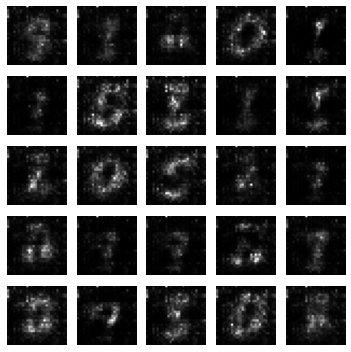


\epoch 261.000000 , ncv_G_Loss: 0.828365, cv_D_loss: 3.736453, cv_acc: 0.594300

\epoch 262.000000 , ncv_G_Loss: 0.277655, cv_D_loss: 3.224988, cv_acc: 0.729700

\epoch 263.000000 , ncv_G_Loss: 0.258014, cv_D_loss: 3.212375, cv_acc: 0.752400

\epoch 264.000000 , ncv_G_Loss: 0.629852, cv_D_loss: 3.332076, cv_acc: 0.751800
Model saved

\epoch 265.000000 , ncv_G_Loss: 0.889759, cv_D_loss: 3.549566, cv_acc: 0.775500

\epoch 266.000000 , ncv_G_Loss: 0.310951, cv_D_loss: 3.365615, cv_acc: 0.586000

\epoch 267.000000 , ncv_G_Loss: 0.458950, cv_D_loss: 3.250185, cv_acc: 0.700900

\epoch 268.000000 , ncv_G_Loss: 0.800595, cv_D_loss: 3.571389, cv_acc: 0.723000

\epoch 269.000000 , ncv_G_Loss: 0.589645, cv_D_loss: 3.409281, cv_acc: 0.632200

\epoch 270.000000 , ncv_G_Loss: 0.360979, cv_D_loss: 3.572327, cv_acc: 0.491400


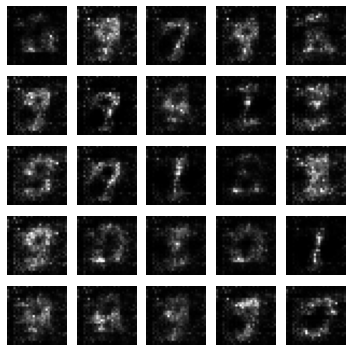


\epoch 271.000000 , ncv_G_Loss: 1.161275, cv_D_loss: 4.449574, cv_acc: 0.751400

\epoch 272.000000 , ncv_G_Loss: 0.358915, cv_D_loss: 3.237950, cv_acc: 0.734300

\epoch 273.000000 , ncv_G_Loss: 0.890985, cv_D_loss: 3.610188, cv_acc: 0.719300

\epoch 274.000000 , ncv_G_Loss: 1.890399, cv_D_loss: 5.633506, cv_acc: 0.500300

\epoch 275.000000 , ncv_G_Loss: 0.512135, cv_D_loss: 3.254394, cv_acc: 0.758700

\epoch 276.000000 , ncv_G_Loss: 0.289671, cv_D_loss: 3.273174, cv_acc: 0.721500

\epoch 277.000000 , ncv_G_Loss: 0.626191, cv_D_loss: 3.309403, cv_acc: 0.769700

\epoch 278.000000 , ncv_G_Loss: 0.441067, cv_D_loss: 3.218557, cv_acc: 0.678600

\epoch 279.000000 , ncv_G_Loss: 0.274028, cv_D_loss: 3.364926, cv_acc: 0.630900

\epoch 280.000000 , ncv_G_Loss: 0.604021, cv_D_loss: 3.464257, cv_acc: 0.629200


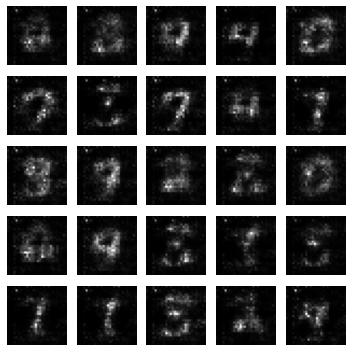


\epoch 281.000000 , ncv_G_Loss: 0.428699, cv_D_loss: 3.166899, cv_acc: 0.730700

\epoch 282.000000 , ncv_G_Loss: 0.718605, cv_D_loss: 3.423508, cv_acc: 0.764900

\epoch 283.000000 , ncv_G_Loss: 0.424213, cv_D_loss: 3.204326, cv_acc: 0.728900
Model saved

\epoch 284.000000 , ncv_G_Loss: 0.364366, cv_D_loss: 3.118839, cv_acc: 0.786300

\epoch 285.000000 , ncv_G_Loss: 0.499236, cv_D_loss: 3.308739, cv_acc: 0.674500

\epoch 286.000000 , ncv_G_Loss: 0.514387, cv_D_loss: 3.089440, cv_acc: 0.743800

\epoch 287.000000 , ncv_G_Loss: 0.645654, cv_D_loss: 3.230423, cv_acc: 0.732100

\epoch 288.000000 , ncv_G_Loss: 0.276065, cv_D_loss: 3.409584, cv_acc: 0.554400

\epoch 289.000000 , ncv_G_Loss: 0.622167, cv_D_loss: 3.324222, cv_acc: 0.732700

\epoch 290.000000 , ncv_G_Loss: 0.614879, cv_D_loss: 3.270931, cv_acc: 0.681600


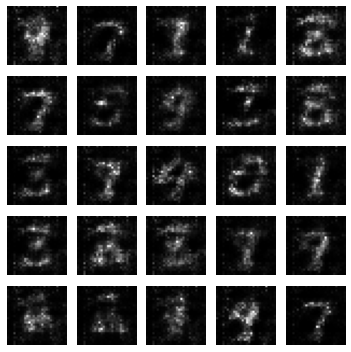


\epoch 291.000000 , ncv_G_Loss: 0.218029, cv_D_loss: 3.340699, cv_acc: 0.698800

\epoch 292.000000 , ncv_G_Loss: 0.869731, cv_D_loss: 3.578994, cv_acc: 0.747400

\epoch 293.000000 , ncv_G_Loss: 0.793880, cv_D_loss: 3.401508, cv_acc: 0.780000

\epoch 294.000000 , ncv_G_Loss: 0.927053, cv_D_loss: 3.794694, cv_acc: 0.727500

\epoch 295.000000 , ncv_G_Loss: 0.498612, cv_D_loss: 3.091709, cv_acc: 0.749500
Model saved

\epoch 296.000000 , ncv_G_Loss: 0.364017, cv_D_loss: 3.002168, cv_acc: 0.792100

\epoch 297.000000 , ncv_G_Loss: 0.186240, cv_D_loss: 3.479711, cv_acc: 0.633700

\epoch 298.000000 , ncv_G_Loss: 0.258228, cv_D_loss: 3.181423, cv_acc: 0.720100

\epoch 299.000000 , ncv_G_Loss: 0.730433, cv_D_loss: 3.457264, cv_acc: 0.642300

\epoch 300.000000 , ncv_G_Loss: 0.446950, cv_D_loss: 3.831530, cv_acc: 0.445200


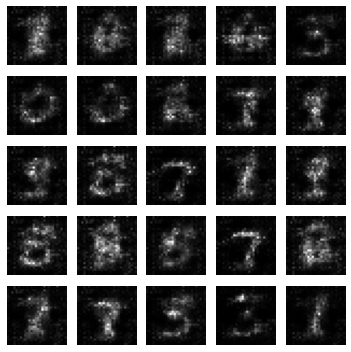


\epoch 301.000000 , ncv_G_Loss: 0.854219, cv_D_loss: 3.579844, cv_acc: 0.583300

\epoch 302.000000 , ncv_G_Loss: 0.492432, cv_D_loss: 3.099090, cv_acc: 0.788700

\epoch 303.000000 , ncv_G_Loss: 1.028794, cv_D_loss: 3.795037, cv_acc: 0.782400

\epoch 304.000000 , ncv_G_Loss: 0.240539, cv_D_loss: 3.102607, cv_acc: 0.790200

\epoch 305.000000 , ncv_G_Loss: 0.639153, cv_D_loss: 3.273744, cv_acc: 0.754100

\epoch 306.000000 , ncv_G_Loss: 0.389715, cv_D_loss: 3.178426, cv_acc: 0.693500

\epoch 307.000000 , ncv_G_Loss: 0.277883, cv_D_loss: 3.115859, cv_acc: 0.765800

\epoch 308.000000 , ncv_G_Loss: 0.428413, cv_D_loss: 3.122585, cv_acc: 0.759400

\epoch 309.000000 , ncv_G_Loss: 0.483724, cv_D_loss: 3.117179, cv_acc: 0.729100

\epoch 310.000000 , ncv_G_Loss: 0.328697, cv_D_loss: 3.072087, cv_acc: 0.709300


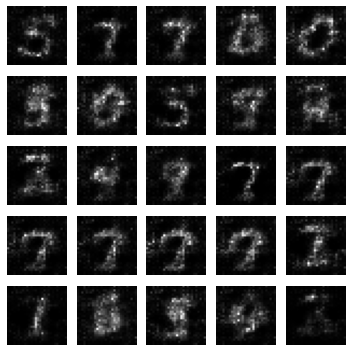


\epoch 311.000000 , ncv_G_Loss: 1.049674, cv_D_loss: 3.645508, cv_acc: 0.748500

\epoch 312.000000 , ncv_G_Loss: 0.768077, cv_D_loss: 3.237861, cv_acc: 0.739900

\epoch 313.000000 , ncv_G_Loss: 0.687777, cv_D_loss: 3.190023, cv_acc: 0.768200

\epoch 314.000000 , ncv_G_Loss: 1.039094, cv_D_loss: 3.780420, cv_acc: 0.779000

\epoch 315.000000 , ncv_G_Loss: 0.429268, cv_D_loss: 2.949037, cv_acc: 0.785800
Model saved

\epoch 316.000000 , ncv_G_Loss: 0.535671, cv_D_loss: 3.047160, cv_acc: 0.797200

\epoch 317.000000 , ncv_G_Loss: 0.338347, cv_D_loss: 3.217338, cv_acc: 0.697400

\epoch 318.000000 , ncv_G_Loss: 0.633025, cv_D_loss: 3.160030, cv_acc: 0.792500

\epoch 319.000000 , ncv_G_Loss: 0.795929, cv_D_loss: 3.533036, cv_acc: 0.686900

\epoch 320.000000 , ncv_G_Loss: 0.383297, cv_D_loss: 3.005070, cv_acc: 0.784500


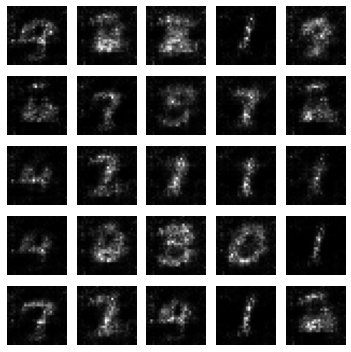


\epoch 321.000000 , ncv_G_Loss: 0.267843, cv_D_loss: 3.099010, cv_acc: 0.751300

\epoch 322.000000 , ncv_G_Loss: 0.807751, cv_D_loss: 3.332689, cv_acc: 0.782700

\epoch 323.000000 , ncv_G_Loss: 0.709134, cv_D_loss: 3.248034, cv_acc: 0.746800

\epoch 324.000000 , ncv_G_Loss: 0.203850, cv_D_loss: 3.121065, cv_acc: 0.779600

\epoch 325.000000 , ncv_G_Loss: 0.665260, cv_D_loss: 3.392379, cv_acc: 0.685800

\epoch 326.000000 , ncv_G_Loss: 1.208219, cv_D_loss: 3.910249, cv_acc: 0.766900

\epoch 327.000000 , ncv_G_Loss: 0.888087, cv_D_loss: 3.394515, cv_acc: 0.755800

\epoch 328.000000 , ncv_G_Loss: 0.632168, cv_D_loss: 3.155149, cv_acc: 0.769300

\epoch 329.000000 , ncv_G_Loss: 0.499131, cv_D_loss: 3.034845, cv_acc: 0.771400

\epoch 330.000000 , ncv_G_Loss: 1.102714, cv_D_loss: 3.820669, cv_acc: 0.643400


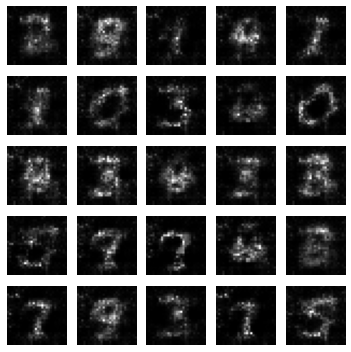


\epoch 331.000000 , ncv_G_Loss: 0.603445, cv_D_loss: 3.107024, cv_acc: 0.791900
Model saved

\epoch 332.000000 , ncv_G_Loss: 0.327411, cv_D_loss: 3.003531, cv_acc: 0.802400

\epoch 333.000000 , ncv_G_Loss: 0.421599, cv_D_loss: 3.035653, cv_acc: 0.763700

\epoch 334.000000 , ncv_G_Loss: 0.426475, cv_D_loss: 3.154709, cv_acc: 0.675600

\epoch 335.000000 , ncv_G_Loss: 1.281350, cv_D_loss: 4.049912, cv_acc: 0.772600

\epoch 336.000000 , ncv_G_Loss: 0.319634, cv_D_loss: 3.091082, cv_acc: 0.687500

\epoch 337.000000 , ncv_G_Loss: 0.219093, cv_D_loss: 3.297237, cv_acc: 0.699100

\epoch 338.000000 , ncv_G_Loss: 0.237459, cv_D_loss: 3.175450, cv_acc: 0.758700

\epoch 339.000000 , ncv_G_Loss: 0.167479, cv_D_loss: 3.255813, cv_acc: 0.775000

\epoch 340.000000 , ncv_G_Loss: 0.518017, cv_D_loss: 3.136359, cv_acc: 0.777200


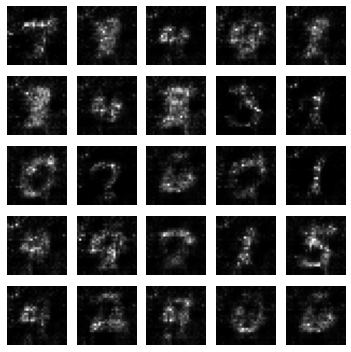


\epoch 341.000000 , ncv_G_Loss: 0.295288, cv_D_loss: 3.008863, cv_acc: 0.765100

\epoch 342.000000 , ncv_G_Loss: 0.383051, cv_D_loss: 2.940818, cv_acc: 0.796600

\epoch 343.000000 , ncv_G_Loss: 0.700462, cv_D_loss: 3.188159, cv_acc: 0.799900

\epoch 344.000000 , ncv_G_Loss: 1.107043, cv_D_loss: 3.781152, cv_acc: 0.674100

\epoch 345.000000 , ncv_G_Loss: 0.607269, cv_D_loss: 3.094333, cv_acc: 0.781900

\epoch 346.000000 , ncv_G_Loss: 0.222279, cv_D_loss: 3.248281, cv_acc: 0.649800

\epoch 347.000000 , ncv_G_Loss: 1.181841, cv_D_loss: 3.863641, cv_acc: 0.784300

\epoch 348.000000 , ncv_G_Loss: 1.179198, cv_D_loss: 3.906432, cv_acc: 0.765000

\epoch 349.000000 , ncv_G_Loss: 0.361096, cv_D_loss: 3.036240, cv_acc: 0.732600

\epoch 350.000000 , ncv_G_Loss: 0.570324, cv_D_loss: 3.143965, cv_acc: 0.770200


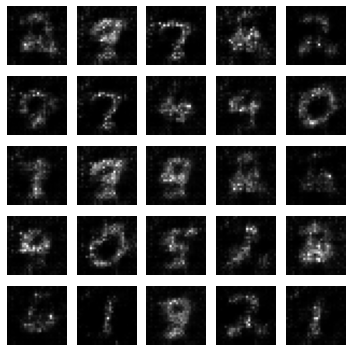


\epoch 351.000000 , ncv_G_Loss: 0.519686, cv_D_loss: 3.192590, cv_acc: 0.699600

\epoch 352.000000 , ncv_G_Loss: 0.297594, cv_D_loss: 3.023213, cv_acc: 0.778300

\epoch 353.000000 , ncv_G_Loss: 0.321010, cv_D_loss: 3.001966, cv_acc: 0.769000

\epoch 354.000000 , ncv_G_Loss: 0.955136, cv_D_loss: 3.410503, cv_acc: 0.783300

\epoch 355.000000 , ncv_G_Loss: 0.517946, cv_D_loss: 2.958465, cv_acc: 0.790300

\epoch 356.000000 , ncv_G_Loss: 0.325118, cv_D_loss: 2.979107, cv_acc: 0.779900

\epoch 357.000000 , ncv_G_Loss: 0.317632, cv_D_loss: 3.159147, cv_acc: 0.728900

\epoch 358.000000 , ncv_G_Loss: 0.484215, cv_D_loss: 2.987193, cv_acc: 0.777600

\epoch 359.000000 , ncv_G_Loss: 0.298990, cv_D_loss: 3.242447, cv_acc: 0.652700

\epoch 360.000000 , ncv_G_Loss: 0.925373, cv_D_loss: 3.618072, cv_acc: 0.682800


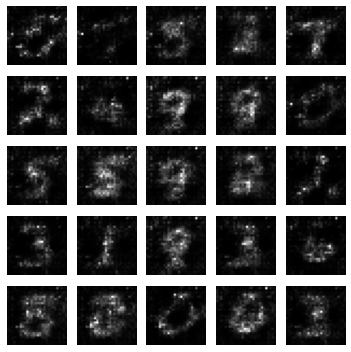


\epoch 361.000000 , ncv_G_Loss: 0.496327, cv_D_loss: 3.070900, cv_acc: 0.742700

\epoch 362.000000 , ncv_G_Loss: 1.261493, cv_D_loss: 4.115843, cv_acc: 0.724400

\epoch 363.000000 , ncv_G_Loss: 0.458293, cv_D_loss: 3.127277, cv_acc: 0.737100

\epoch 364.000000 , ncv_G_Loss: 0.616997, cv_D_loss: 3.046506, cv_acc: 0.779400

\epoch 365.000000 , ncv_G_Loss: 0.609711, cv_D_loss: 3.117764, cv_acc: 0.741100

\epoch 366.000000 , ncv_G_Loss: 0.350403, cv_D_loss: 3.114776, cv_acc: 0.740300

\epoch 367.000000 , ncv_G_Loss: 0.651931, cv_D_loss: 3.180513, cv_acc: 0.715200

\epoch 368.000000 , ncv_G_Loss: 0.627815, cv_D_loss: 3.109490, cv_acc: 0.750700

\epoch 369.000000 , ncv_G_Loss: 1.154316, cv_D_loss: 3.757532, cv_acc: 0.541500

\epoch 370.000000 , ncv_G_Loss: 0.819376, cv_D_loss: 3.458938, cv_acc: 0.758100


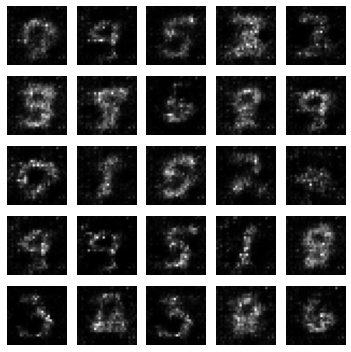


\epoch 371.000000 , ncv_G_Loss: 0.564336, cv_D_loss: 3.034456, cv_acc: 0.786600

\epoch 372.000000 , ncv_G_Loss: 0.843075, cv_D_loss: 3.466676, cv_acc: 0.707700

\epoch 373.000000 , ncv_G_Loss: 1.087223, cv_D_loss: 3.765615, cv_acc: 0.722100

\epoch 374.000000 , ncv_G_Loss: 0.575487, cv_D_loss: 3.253016, cv_acc: 0.733000

\epoch 375.000000 , ncv_G_Loss: 0.951004, cv_D_loss: 3.433317, cv_acc: 0.788200

\epoch 376.000000 , ncv_G_Loss: 0.629451, cv_D_loss: 3.133260, cv_acc: 0.773600

\epoch 377.000000 , ncv_G_Loss: 0.469592, cv_D_loss: 3.172728, cv_acc: 0.665700

\epoch 378.000000 , ncv_G_Loss: 0.452801, cv_D_loss: 3.046287, cv_acc: 0.759500

\epoch 379.000000 , ncv_G_Loss: 0.534646, cv_D_loss: 3.113490, cv_acc: 0.755300
Model saved

\epoch 380.000000 , ncv_G_Loss: 0.231119, cv_D_loss: 2.994258, cv_acc: 0.808000


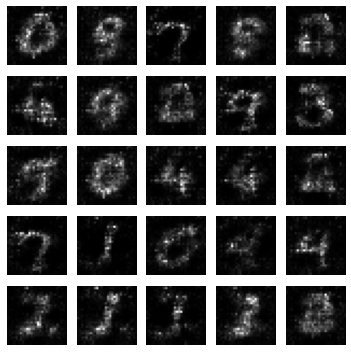


\epoch 381.000000 , ncv_G_Loss: 0.681532, cv_D_loss: 3.118048, cv_acc: 0.801300

\epoch 382.000000 , ncv_G_Loss: 0.831578, cv_D_loss: 3.297362, cv_acc: 0.784900
Model saved

\epoch 383.000000 , ncv_G_Loss: 0.480545, cv_D_loss: 2.876326, cv_acc: 0.812800

\epoch 384.000000 , ncv_G_Loss: 0.583999, cv_D_loss: 3.016337, cv_acc: 0.788200

\epoch 385.000000 , ncv_G_Loss: 1.718010, cv_D_loss: 4.745210, cv_acc: 0.767900

\epoch 386.000000 , ncv_G_Loss: 0.507923, cv_D_loss: 2.938860, cv_acc: 0.751800

\epoch 387.000000 , ncv_G_Loss: 0.368302, cv_D_loss: 3.041638, cv_acc: 0.772600

\epoch 388.000000 , ncv_G_Loss: 0.380904, cv_D_loss: 2.955550, cv_acc: 0.799600

\epoch 389.000000 , ncv_G_Loss: 0.336337, cv_D_loss: 3.003229, cv_acc: 0.752700
Model saved

\epoch 390.000000 , ncv_G_Loss: 0.564557, cv_D_loss: 2.961842, cv_acc: 0.817900


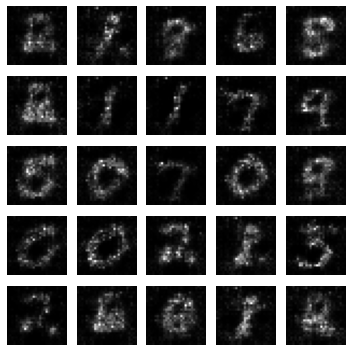


\epoch 391.000000 , ncv_G_Loss: 0.466082, cv_D_loss: 2.987190, cv_acc: 0.793500

\epoch 392.000000 , ncv_G_Loss: 0.181245, cv_D_loss: 3.270032, cv_acc: 0.718900

\epoch 393.000000 , ncv_G_Loss: 0.880104, cv_D_loss: 3.588934, cv_acc: 0.683400

\epoch 394.000000 , ncv_G_Loss: 0.526233, cv_D_loss: 3.148925, cv_acc: 0.688100

\epoch 395.000000 , ncv_G_Loss: 0.500828, cv_D_loss: 3.015710, cv_acc: 0.776400

\epoch 396.000000 , ncv_G_Loss: 0.634369, cv_D_loss: 3.135725, cv_acc: 0.804200

\epoch 397.000000 , ncv_G_Loss: 0.653293, cv_D_loss: 3.082026, cv_acc: 0.793700

\epoch 398.000000 , ncv_G_Loss: 0.371399, cv_D_loss: 3.044596, cv_acc: 0.799700
Model saved

\epoch 399.000000 , ncv_G_Loss: 0.302438, cv_D_loss: 2.947177, cv_acc: 0.821700

\epoch 400.000000 , ncv_G_Loss: 0.775182, cv_D_loss: 3.235795, cv_acc: 0.820000


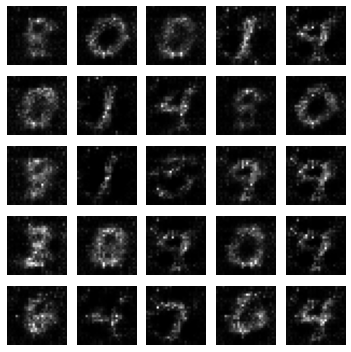


\epoch 401.000000 , ncv_G_Loss: 0.400970, cv_D_loss: 3.132885, cv_acc: 0.724400

\epoch 402.000000 , ncv_G_Loss: 0.833355, cv_D_loss: 3.334418, cv_acc: 0.808500

\epoch 403.000000 , ncv_G_Loss: 0.606084, cv_D_loss: 3.095005, cv_acc: 0.803900

\epoch 404.000000 , ncv_G_Loss: 0.667977, cv_D_loss: 3.254505, cv_acc: 0.803200

\epoch 405.000000 , ncv_G_Loss: 0.524373, cv_D_loss: 2.967595, cv_acc: 0.815900

\epoch 406.000000 , ncv_G_Loss: 1.270918, cv_D_loss: 4.016165, cv_acc: 0.799000

\epoch 407.000000 , ncv_G_Loss: 0.880018, cv_D_loss: 3.423393, cv_acc: 0.804200

\epoch 408.000000 , ncv_G_Loss: 0.272977, cv_D_loss: 2.951307, cv_acc: 0.799300

\epoch 409.000000 , ncv_G_Loss: 0.807980, cv_D_loss: 3.309996, cv_acc: 0.779300

\epoch 410.000000 , ncv_G_Loss: 0.531464, cv_D_loss: 2.968781, cv_acc: 0.809000


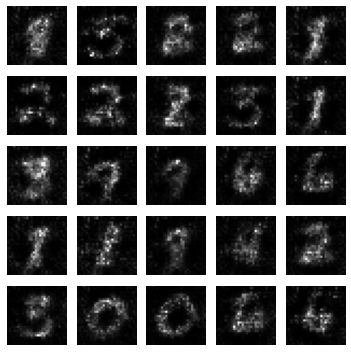


\epoch 411.000000 , ncv_G_Loss: 0.829948, cv_D_loss: 3.320024, cv_acc: 0.699300

\epoch 412.000000 , ncv_G_Loss: 1.327018, cv_D_loss: 4.069233, cv_acc: 0.807200

\epoch 413.000000 , ncv_G_Loss: 0.910085, cv_D_loss: 3.605464, cv_acc: 0.734900

\epoch 414.000000 , ncv_G_Loss: 0.877186, cv_D_loss: 3.434619, cv_acc: 0.759200

\epoch 415.000000 , ncv_G_Loss: 0.490141, cv_D_loss: 3.049406, cv_acc: 0.777700

\epoch 416.000000 , ncv_G_Loss: 0.613172, cv_D_loss: 3.270935, cv_acc: 0.716600

\epoch 417.000000 , ncv_G_Loss: 0.661798, cv_D_loss: 3.296597, cv_acc: 0.740700
Model saved

\epoch 418.000000 , ncv_G_Loss: 0.991411, cv_D_loss: 3.586591, cv_acc: 0.825300

\epoch 419.000000 , ncv_G_Loss: 0.528292, cv_D_loss: 3.181702, cv_acc: 0.777100

\epoch 420.000000 , ncv_G_Loss: 0.537041, cv_D_loss: 2.991401, cv_acc: 0.791400


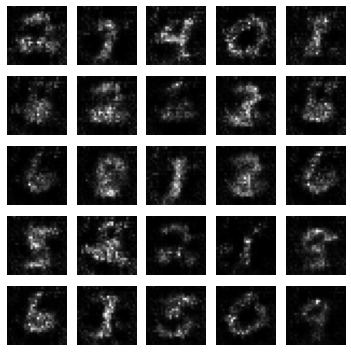


\epoch 421.000000 , ncv_G_Loss: 0.494090, cv_D_loss: 2.958602, cv_acc: 0.816200

\epoch 422.000000 , ncv_G_Loss: 0.963266, cv_D_loss: 3.423316, cv_acc: 0.823800

\epoch 423.000000 , ncv_G_Loss: 0.690447, cv_D_loss: 3.574885, cv_acc: 0.648000

\epoch 424.000000 , ncv_G_Loss: 1.049317, cv_D_loss: 3.616601, cv_acc: 0.808800

\epoch 425.000000 , ncv_G_Loss: 0.838995, cv_D_loss: 3.521822, cv_acc: 0.727700

\epoch 426.000000 , ncv_G_Loss: 1.213624, cv_D_loss: 3.872838, cv_acc: 0.807900

\epoch 427.000000 , ncv_G_Loss: 2.420707, cv_D_loss: 6.183075, cv_acc: 0.691600

\epoch 428.000000 , ncv_G_Loss: 1.021197, cv_D_loss: 3.920170, cv_acc: 0.715500

\epoch 429.000000 , ncv_G_Loss: 0.992470, cv_D_loss: 3.600371, cv_acc: 0.814700

\epoch 430.000000 , ncv_G_Loss: 0.622455, cv_D_loss: 3.008716, cv_acc: 0.784900


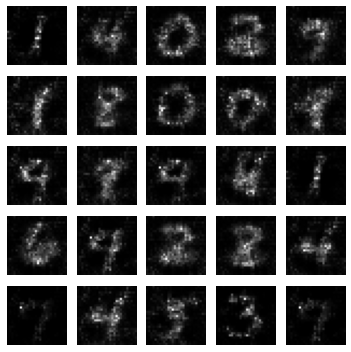


\epoch 431.000000 , ncv_G_Loss: 1.210953, cv_D_loss: 4.095611, cv_acc: 0.748600

\epoch 432.000000 , ncv_G_Loss: 0.565184, cv_D_loss: 3.017852, cv_acc: 0.794200

\epoch 433.000000 , ncv_G_Loss: 1.097680, cv_D_loss: 3.699389, cv_acc: 0.796900

\epoch 434.000000 , ncv_G_Loss: 0.352753, cv_D_loss: 3.001504, cv_acc: 0.776800

\epoch 435.000000 , ncv_G_Loss: 0.889257, cv_D_loss: 3.811837, cv_acc: 0.708700

\epoch 436.000000 , ncv_G_Loss: 0.915521, cv_D_loss: 3.536152, cv_acc: 0.715300
Model saved

\epoch 437.000000 , ncv_G_Loss: 1.170353, cv_D_loss: 3.697615, cv_acc: 0.827600

\epoch 438.000000 , ncv_G_Loss: 0.401111, cv_D_loss: 2.867056, cv_acc: 0.824700

\epoch 439.000000 , ncv_G_Loss: 0.189373, cv_D_loss: 3.036479, cv_acc: 0.816400

\epoch 440.000000 , ncv_G_Loss: 0.229603, cv_D_loss: 2.964851, cv_acc: 0.810100


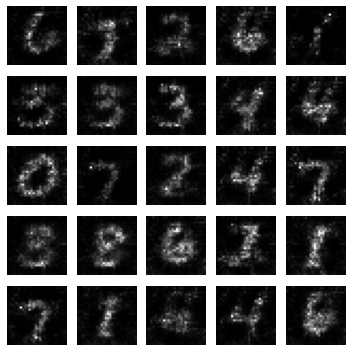


\epoch 441.000000 , ncv_G_Loss: 0.540090, cv_D_loss: 2.990723, cv_acc: 0.788800

\epoch 442.000000 , ncv_G_Loss: 0.296174, cv_D_loss: 2.960956, cv_acc: 0.788100

\epoch 443.000000 , ncv_G_Loss: 0.229203, cv_D_loss: 3.093837, cv_acc: 0.768400

\epoch 444.000000 , ncv_G_Loss: 0.139828, cv_D_loss: 3.208327, cv_acc: 0.827100

\epoch 445.000000 , ncv_G_Loss: 0.672866, cv_D_loss: 3.249992, cv_acc: 0.786900

\epoch 446.000000 , ncv_G_Loss: 0.518626, cv_D_loss: 2.857271, cv_acc: 0.811600

\epoch 447.000000 , ncv_G_Loss: 0.426755, cv_D_loss: 2.884901, cv_acc: 0.795300
Model saved

\epoch 448.000000 , ncv_G_Loss: 0.394204, cv_D_loss: 2.891102, cv_acc: 0.830900

\epoch 449.000000 , ncv_G_Loss: 0.156493, cv_D_loss: 3.163314, cv_acc: 0.827900
Model saved

\epoch 450.000000 , ncv_G_Loss: 1.052115, cv_D_loss: 3.656166, cv_acc: 0.837700


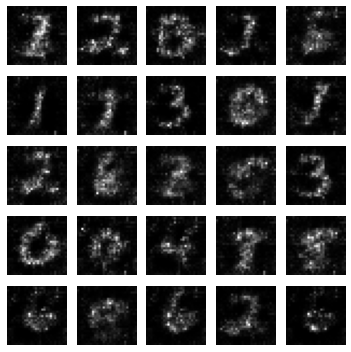


\epoch 451.000000 , ncv_G_Loss: 0.655375, cv_D_loss: 3.347263, cv_acc: 0.704500

\epoch 452.000000 , ncv_G_Loss: 0.684921, cv_D_loss: 3.070292, cv_acc: 0.813100

\epoch 453.000000 , ncv_G_Loss: 0.428101, cv_D_loss: 2.937568, cv_acc: 0.771400

\epoch 454.000000 , ncv_G_Loss: 0.629584, cv_D_loss: 3.091658, cv_acc: 0.795000

\epoch 455.000000 , ncv_G_Loss: 0.442102, cv_D_loss: 2.860985, cv_acc: 0.828800

\epoch 456.000000 , ncv_G_Loss: 0.484574, cv_D_loss: 2.866307, cv_acc: 0.824200

\epoch 457.000000 , ncv_G_Loss: 0.484398, cv_D_loss: 2.867393, cv_acc: 0.827100

\epoch 458.000000 , ncv_G_Loss: 0.335067, cv_D_loss: 2.877256, cv_acc: 0.808600

\epoch 459.000000 , ncv_G_Loss: 0.676923, cv_D_loss: 3.298717, cv_acc: 0.755100

\epoch 460.000000 , ncv_G_Loss: 0.724633, cv_D_loss: 2.978608, cv_acc: 0.816600


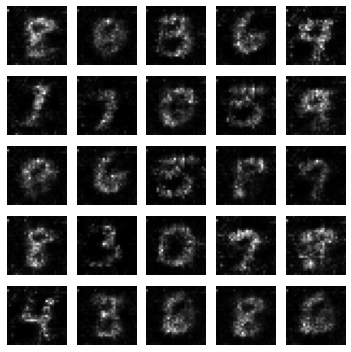


\epoch 461.000000 , ncv_G_Loss: 0.501967, cv_D_loss: 3.415387, cv_acc: 0.525100

\epoch 462.000000 , ncv_G_Loss: 0.638704, cv_D_loss: 3.147194, cv_acc: 0.785700

\epoch 463.000000 , ncv_G_Loss: 0.886138, cv_D_loss: 3.738720, cv_acc: 0.642300

\epoch 464.000000 , ncv_G_Loss: 0.583661, cv_D_loss: 2.873644, cv_acc: 0.837200

\epoch 465.000000 , ncv_G_Loss: 0.391316, cv_D_loss: 2.969523, cv_acc: 0.814000

\epoch 466.000000 , ncv_G_Loss: 0.385765, cv_D_loss: 2.872706, cv_acc: 0.825400

\epoch 467.000000 , ncv_G_Loss: 0.222601, cv_D_loss: 3.022936, cv_acc: 0.802500

\epoch 468.000000 , ncv_G_Loss: 0.743537, cv_D_loss: 3.181722, cv_acc: 0.824500

\epoch 469.000000 , ncv_G_Loss: 0.218142, cv_D_loss: 2.970965, cv_acc: 0.833000
Model saved

\epoch 470.000000 , ncv_G_Loss: 0.386653, cv_D_loss: 2.796950, cv_acc: 0.840300


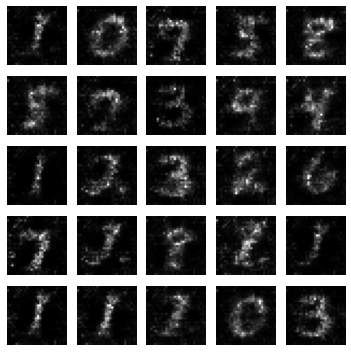


\epoch 471.000000 , ncv_G_Loss: 0.201423, cv_D_loss: 3.064318, cv_acc: 0.769500

\epoch 472.000000 , ncv_G_Loss: 0.423588, cv_D_loss: 2.951815, cv_acc: 0.801400

\epoch 473.000000 , ncv_G_Loss: 0.989347, cv_D_loss: 3.480650, cv_acc: 0.819800

\epoch 474.000000 , ncv_G_Loss: 0.372137, cv_D_loss: 2.871138, cv_acc: 0.825500

\epoch 475.000000 , ncv_G_Loss: 0.302025, cv_D_loss: 2.842357, cv_acc: 0.839500
Model saved

\epoch 476.000000 , ncv_G_Loss: 0.506850, cv_D_loss: 2.813305, cv_acc: 0.843700

\epoch 477.000000 , ncv_G_Loss: 0.621635, cv_D_loss: 2.930199, cv_acc: 0.805300

\epoch 478.000000 , ncv_G_Loss: 1.519052, cv_D_loss: 4.302273, cv_acc: 0.784700

\epoch 479.000000 , ncv_G_Loss: 0.287451, cv_D_loss: 3.147122, cv_acc: 0.705900

\epoch 480.000000 , ncv_G_Loss: 0.330474, cv_D_loss: 2.832866, cv_acc: 0.838100


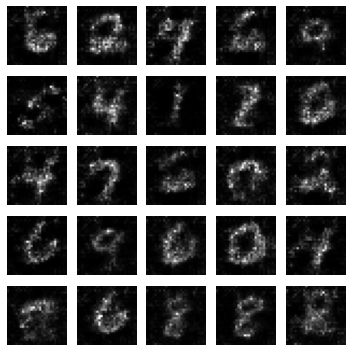


\epoch 481.000000 , ncv_G_Loss: 0.286192, cv_D_loss: 2.851682, cv_acc: 0.809100

\epoch 482.000000 , ncv_G_Loss: 0.472833, cv_D_loss: 3.104501, cv_acc: 0.761300

\epoch 483.000000 , ncv_G_Loss: 0.362615, cv_D_loss: 2.892179, cv_acc: 0.797600

\epoch 484.000000 , ncv_G_Loss: 0.374624, cv_D_loss: 2.816696, cv_acc: 0.828200

\epoch 485.000000 , ncv_G_Loss: 0.706956, cv_D_loss: 3.121328, cv_acc: 0.796200
Model saved

\epoch 486.000000 , ncv_G_Loss: 0.373816, cv_D_loss: 2.782743, cv_acc: 0.844300

\epoch 487.000000 , ncv_G_Loss: 1.359181, cv_D_loss: 3.955914, cv_acc: 0.832200

\epoch 488.000000 , ncv_G_Loss: 0.634267, cv_D_loss: 3.096875, cv_acc: 0.818700

\epoch 489.000000 , ncv_G_Loss: 0.388051, cv_D_loss: 2.916225, cv_acc: 0.823300

\epoch 490.000000 , ncv_G_Loss: 0.510438, cv_D_loss: 2.847918, cv_acc: 0.805500


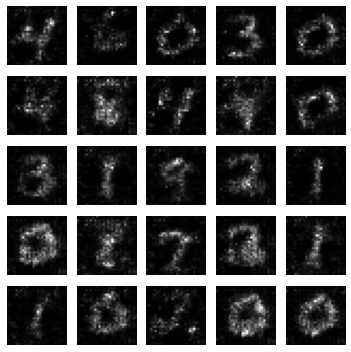


\epoch 491.000000 , ncv_G_Loss: 0.538701, cv_D_loss: 3.119504, cv_acc: 0.725200

\epoch 492.000000 , ncv_G_Loss: 1.323240, cv_D_loss: 4.211736, cv_acc: 0.742600

\epoch 493.000000 , ncv_G_Loss: 0.791414, cv_D_loss: 3.199431, cv_acc: 0.814600
Model saved

\epoch 494.000000 , ncv_G_Loss: 0.652210, cv_D_loss: 3.030730, cv_acc: 0.847900

\epoch 495.000000 , ncv_G_Loss: 0.517630, cv_D_loss: 2.843877, cv_acc: 0.843000

\epoch 496.000000 , ncv_G_Loss: 0.434018, cv_D_loss: 2.901834, cv_acc: 0.796600

\epoch 497.000000 , ncv_G_Loss: 0.535678, cv_D_loss: 3.008880, cv_acc: 0.790100

\epoch 498.000000 , ncv_G_Loss: 0.521506, cv_D_loss: 2.929735, cv_acc: 0.832400

\epoch 499.000000 , ncv_G_Loss: 0.355742, cv_D_loss: 2.896366, cv_acc: 0.847900

\epoch 500.000000 , ncv_G_Loss: 0.309161, cv_D_loss: 3.064036, cv_acc: 0.734100


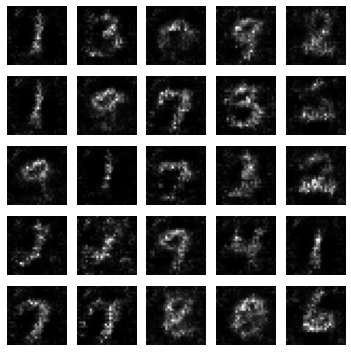


\epoch 501.000000 , ncv_G_Loss: 0.971292, cv_D_loss: 3.472080, cv_acc: 0.779800

\epoch 502.000000 , ncv_G_Loss: 0.801914, cv_D_loss: 3.494990, cv_acc: 0.767500

\epoch 503.000000 , ncv_G_Loss: 0.602548, cv_D_loss: 3.001273, cv_acc: 0.837300

\epoch 504.000000 , ncv_G_Loss: 0.946434, cv_D_loss: 3.291866, cv_acc: 0.810900

\epoch 505.000000 , ncv_G_Loss: 0.721289, cv_D_loss: 3.378195, cv_acc: 0.812700

\epoch 506.000000 , ncv_G_Loss: 0.301806, cv_D_loss: 2.875745, cv_acc: 0.820200

\epoch 507.000000 , ncv_G_Loss: 0.589216, cv_D_loss: 2.930896, cv_acc: 0.839600

\epoch 508.000000 , ncv_G_Loss: 0.673093, cv_D_loss: 3.191475, cv_acc: 0.784400

\epoch 509.000000 , ncv_G_Loss: 0.967395, cv_D_loss: 3.346559, cv_acc: 0.846800

\epoch 510.000000 , ncv_G_Loss: 0.842631, cv_D_loss: 3.387709, cv_acc: 0.800000


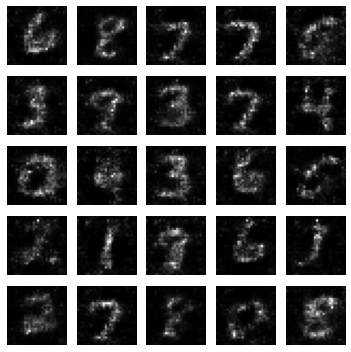


\epoch 511.000000 , ncv_G_Loss: 0.828210, cv_D_loss: 3.198147, cv_acc: 0.813100

\epoch 512.000000 , ncv_G_Loss: 0.295616, cv_D_loss: 2.858412, cv_acc: 0.801600

\epoch 513.000000 , ncv_G_Loss: 0.717301, cv_D_loss: 3.025895, cv_acc: 0.828300

\epoch 514.000000 , ncv_G_Loss: 0.545942, cv_D_loss: 2.944929, cv_acc: 0.804100

\epoch 515.000000 , ncv_G_Loss: 0.435256, cv_D_loss: 2.801067, cv_acc: 0.843400

\epoch 516.000000 , ncv_G_Loss: 0.541473, cv_D_loss: 2.834193, cv_acc: 0.843800

\epoch 517.000000 , ncv_G_Loss: 0.309960, cv_D_loss: 2.964058, cv_acc: 0.785100

\epoch 518.000000 , ncv_G_Loss: 0.639977, cv_D_loss: 2.911244, cv_acc: 0.839400

\epoch 519.000000 , ncv_G_Loss: 0.351952, cv_D_loss: 2.762991, cv_acc: 0.824700

\epoch 520.000000 , ncv_G_Loss: 0.357644, cv_D_loss: 3.138535, cv_acc: 0.754400


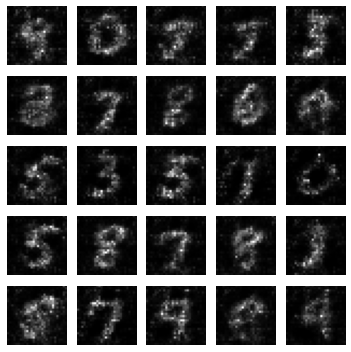


\epoch 521.000000 , ncv_G_Loss: 0.450000, cv_D_loss: 2.933408, cv_acc: 0.834000

\epoch 522.000000 , ncv_G_Loss: 0.813765, cv_D_loss: 3.178863, cv_acc: 0.841400

\epoch 523.000000 , ncv_G_Loss: 0.569594, cv_D_loss: 2.884292, cv_acc: 0.826200

\epoch 524.000000 , ncv_G_Loss: 0.546403, cv_D_loss: 2.912943, cv_acc: 0.826400

\epoch 525.000000 , ncv_G_Loss: 0.454034, cv_D_loss: 3.009534, cv_acc: 0.718400

\epoch 526.000000 , ncv_G_Loss: 0.396590, cv_D_loss: 2.833461, cv_acc: 0.841900

\epoch 527.000000 , ncv_G_Loss: 0.751290, cv_D_loss: 3.187570, cv_acc: 0.804000

\epoch 528.000000 , ncv_G_Loss: 0.398095, cv_D_loss: 2.768584, cv_acc: 0.816400

\epoch 529.000000 , ncv_G_Loss: 0.876001, cv_D_loss: 3.300997, cv_acc: 0.790000

\epoch 530.000000 , ncv_G_Loss: 0.422483, cv_D_loss: 2.905709, cv_acc: 0.813800


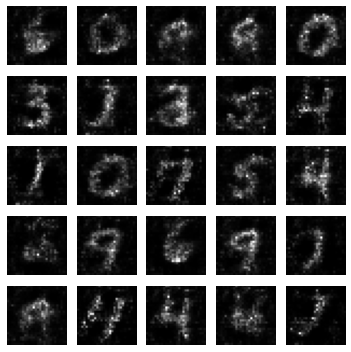


\epoch 531.000000 , ncv_G_Loss: 0.436871, cv_D_loss: 2.819618, cv_acc: 0.825000

\epoch 532.000000 , ncv_G_Loss: 0.786422, cv_D_loss: 3.158763, cv_acc: 0.829600

\epoch 533.000000 , ncv_G_Loss: 0.603099, cv_D_loss: 2.949938, cv_acc: 0.830100

\epoch 534.000000 , ncv_G_Loss: 0.574802, cv_D_loss: 2.906301, cv_acc: 0.833500

\epoch 535.000000 , ncv_G_Loss: 0.700259, cv_D_loss: 2.961752, cv_acc: 0.808900

\epoch 536.000000 , ncv_G_Loss: 0.681647, cv_D_loss: 2.945387, cv_acc: 0.842900

\epoch 537.000000 , ncv_G_Loss: 0.712629, cv_D_loss: 3.170129, cv_acc: 0.801100

\epoch 538.000000 , ncv_G_Loss: 0.364973, cv_D_loss: 2.882551, cv_acc: 0.814100
Model saved

\epoch 539.000000 , ncv_G_Loss: 1.057257, cv_D_loss: 3.484498, cv_acc: 0.848800

\epoch 540.000000 , ncv_G_Loss: 0.388744, cv_D_loss: 2.951849, cv_acc: 0.752700


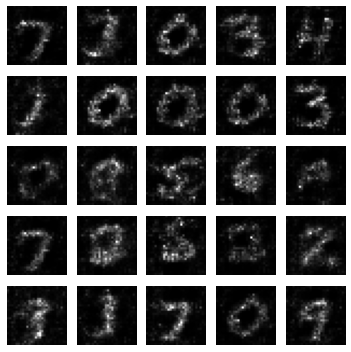


\epoch 541.000000 , ncv_G_Loss: 0.390600, cv_D_loss: 2.848380, cv_acc: 0.838800

\epoch 542.000000 , ncv_G_Loss: 0.503444, cv_D_loss: 3.055365, cv_acc: 0.754000

\epoch 543.000000 , ncv_G_Loss: 0.410324, cv_D_loss: 2.933039, cv_acc: 0.785500

\epoch 544.000000 , ncv_G_Loss: 0.384237, cv_D_loss: 2.949080, cv_acc: 0.776800
Model saved

\epoch 545.000000 , ncv_G_Loss: 0.501077, cv_D_loss: 2.818068, cv_acc: 0.851900

\epoch 546.000000 , ncv_G_Loss: 0.342778, cv_D_loss: 2.790401, cv_acc: 0.842700

\epoch 547.000000 , ncv_G_Loss: 0.715456, cv_D_loss: 3.137434, cv_acc: 0.824600

\epoch 548.000000 , ncv_G_Loss: 0.843288, cv_D_loss: 3.440840, cv_acc: 0.796100

\epoch 549.000000 , ncv_G_Loss: 0.689127, cv_D_loss: 3.020108, cv_acc: 0.827600

\epoch 550.000000 , ncv_G_Loss: 0.635721, cv_D_loss: 3.060798, cv_acc: 0.815300


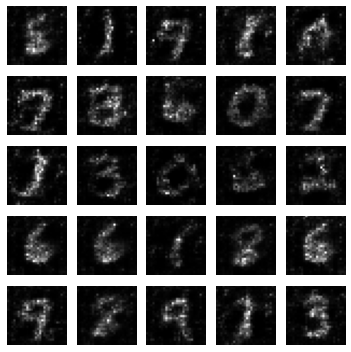


\epoch 551.000000 , ncv_G_Loss: 0.412207, cv_D_loss: 2.774421, cv_acc: 0.849900

\epoch 552.000000 , ncv_G_Loss: 0.810136, cv_D_loss: 3.236414, cv_acc: 0.778200

\epoch 553.000000 , ncv_G_Loss: 0.647710, cv_D_loss: 3.096949, cv_acc: 0.810000

\epoch 554.000000 , ncv_G_Loss: 0.837812, cv_D_loss: 3.670708, cv_acc: 0.748600

\epoch 555.000000 , ncv_G_Loss: 1.425120, cv_D_loss: 4.209492, cv_acc: 0.816900

\epoch 556.000000 , ncv_G_Loss: 0.460821, cv_D_loss: 2.923521, cv_acc: 0.841200

\epoch 557.000000 , ncv_G_Loss: 0.352760, cv_D_loss: 3.183540, cv_acc: 0.671500

\epoch 558.000000 , ncv_G_Loss: 0.348027, cv_D_loss: 2.802051, cv_acc: 0.846300

\epoch 559.000000 , ncv_G_Loss: 0.251932, cv_D_loss: 2.998998, cv_acc: 0.775200

\epoch 560.000000 , ncv_G_Loss: 0.496563, cv_D_loss: 2.859397, cv_acc: 0.833900


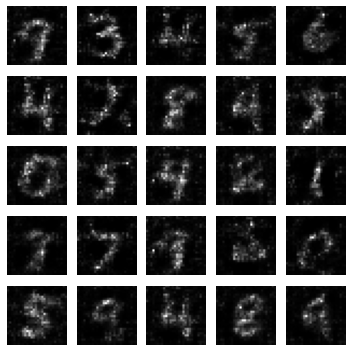


\epoch 561.000000 , ncv_G_Loss: 0.242211, cv_D_loss: 2.967531, cv_acc: 0.805600

\epoch 562.000000 , ncv_G_Loss: 1.117914, cv_D_loss: 3.662642, cv_acc: 0.839200

\epoch 563.000000 , ncv_G_Loss: 0.573086, cv_D_loss: 3.190836, cv_acc: 0.773300

\epoch 564.000000 , ncv_G_Loss: 0.759408, cv_D_loss: 3.527021, cv_acc: 0.663900

\epoch 565.000000 , ncv_G_Loss: 1.789154, cv_D_loss: 5.126516, cv_acc: 0.781300

\epoch 566.000000 , ncv_G_Loss: 0.343941, cv_D_loss: 2.769071, cv_acc: 0.837000

\epoch 567.000000 , ncv_G_Loss: 0.743318, cv_D_loss: 3.329845, cv_acc: 0.739900

\epoch 568.000000 , ncv_G_Loss: 0.747455, cv_D_loss: 3.517824, cv_acc: 0.646300

\epoch 569.000000 , ncv_G_Loss: 0.251777, cv_D_loss: 2.950908, cv_acc: 0.791400

\epoch 570.000000 , ncv_G_Loss: 0.877225, cv_D_loss: 3.446441, cv_acc: 0.784000


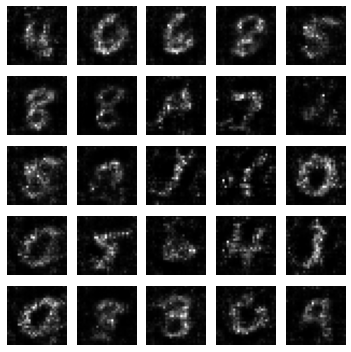


\epoch 571.000000 , ncv_G_Loss: 0.653318, cv_D_loss: 2.887603, cv_acc: 0.849900

\epoch 572.000000 , ncv_G_Loss: 0.517652, cv_D_loss: 2.913323, cv_acc: 0.842700

\epoch 573.000000 , ncv_G_Loss: 0.456539, cv_D_loss: 2.859261, cv_acc: 0.823100

\epoch 574.000000 , ncv_G_Loss: 0.447964, cv_D_loss: 2.848008, cv_acc: 0.828200

\epoch 575.000000 , ncv_G_Loss: 0.575872, cv_D_loss: 2.966275, cv_acc: 0.811300

\epoch 576.000000 , ncv_G_Loss: 0.293505, cv_D_loss: 2.866434, cv_acc: 0.815700

\epoch 577.000000 , ncv_G_Loss: 0.282310, cv_D_loss: 2.766965, cv_acc: 0.851300

\epoch 578.000000 , ncv_G_Loss: 0.791980, cv_D_loss: 3.489120, cv_acc: 0.670800

\epoch 579.000000 , ncv_G_Loss: 0.414567, cv_D_loss: 2.820619, cv_acc: 0.802800

\epoch 580.000000 , ncv_G_Loss: 0.683224, cv_D_loss: 3.041105, cv_acc: 0.838400


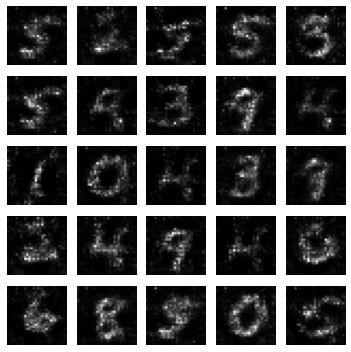


\epoch 581.000000 , ncv_G_Loss: 0.950226, cv_D_loss: 3.339758, cv_acc: 0.843300

\epoch 582.000000 , ncv_G_Loss: 0.328812, cv_D_loss: 2.856250, cv_acc: 0.822100

\epoch 583.000000 , ncv_G_Loss: 0.373518, cv_D_loss: 2.700057, cv_acc: 0.845600

\epoch 584.000000 , ncv_G_Loss: 0.525145, cv_D_loss: 2.984419, cv_acc: 0.783400

\epoch 585.000000 , ncv_G_Loss: 0.637990, cv_D_loss: 3.010774, cv_acc: 0.787700

\epoch 586.000000 , ncv_G_Loss: 0.633476, cv_D_loss: 3.158866, cv_acc: 0.771400

\epoch 587.000000 , ncv_G_Loss: 0.535991, cv_D_loss: 2.932171, cv_acc: 0.832000

\epoch 588.000000 , ncv_G_Loss: 0.344191, cv_D_loss: 2.771327, cv_acc: 0.831400

\epoch 589.000000 , ncv_G_Loss: 1.109034, cv_D_loss: 3.589650, cv_acc: 0.833900

\epoch 590.000000 , ncv_G_Loss: 1.360449, cv_D_loss: 4.097296, cv_acc: 0.760700


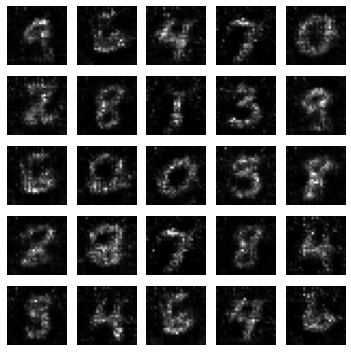


\epoch 591.000000 , ncv_G_Loss: 0.353270, cv_D_loss: 2.732252, cv_acc: 0.849100

\epoch 592.000000 , ncv_G_Loss: 0.421553, cv_D_loss: 3.561342, cv_acc: 0.516600

\epoch 593.000000 , ncv_G_Loss: 0.377460, cv_D_loss: 2.770102, cv_acc: 0.849900

\epoch 594.000000 , ncv_G_Loss: 0.846809, cv_D_loss: 3.336329, cv_acc: 0.837800

\epoch 595.000000 , ncv_G_Loss: 0.915943, cv_D_loss: 3.244004, cv_acc: 0.841900

\epoch 596.000000 , ncv_G_Loss: 0.565179, cv_D_loss: 2.816122, cv_acc: 0.838100
Model saved

\epoch 597.000000 , ncv_G_Loss: 0.851191, cv_D_loss: 3.222420, cv_acc: 0.855900

\epoch 598.000000 , ncv_G_Loss: 1.781073, cv_D_loss: 4.979791, cv_acc: 0.619200

\epoch 599.000000 , ncv_G_Loss: 0.431210, cv_D_loss: 2.782553, cv_acc: 0.831200

\epoch 600.000000 , ncv_G_Loss: 0.592301, cv_D_loss: 2.903876, cv_acc: 0.838000


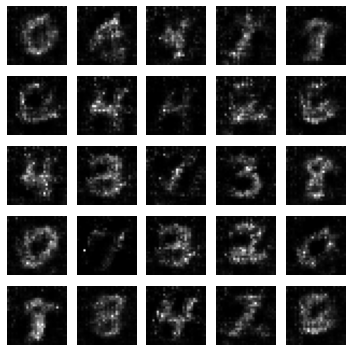


\epoch 601.000000 , ncv_G_Loss: 0.313308, cv_D_loss: 2.816797, cv_acc: 0.847400

\epoch 602.000000 , ncv_G_Loss: 0.677345, cv_D_loss: 2.992493, cv_acc: 0.842300

\epoch 603.000000 , ncv_G_Loss: 0.639348, cv_D_loss: 2.966909, cv_acc: 0.826500

\epoch 604.000000 , ncv_G_Loss: 0.776800, cv_D_loss: 3.133879, cv_acc: 0.844700

\epoch 605.000000 , ncv_G_Loss: 0.575571, cv_D_loss: 2.840515, cv_acc: 0.823800

\epoch 606.000000 , ncv_G_Loss: 0.436219, cv_D_loss: 2.782387, cv_acc: 0.832200

\epoch 607.000000 , ncv_G_Loss: 0.987728, cv_D_loss: 3.441599, cv_acc: 0.822400

\epoch 608.000000 , ncv_G_Loss: 0.797356, cv_D_loss: 3.363113, cv_acc: 0.825000

\epoch 609.000000 , ncv_G_Loss: 0.468645, cv_D_loss: 2.734616, cv_acc: 0.849800

\epoch 610.000000 , ncv_G_Loss: 1.142961, cv_D_loss: 3.808699, cv_acc: 0.817400


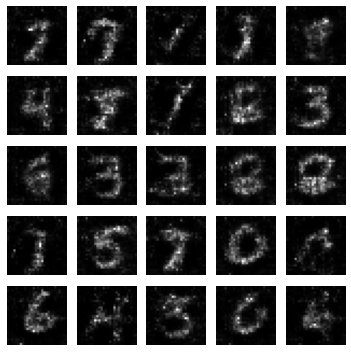


\epoch 611.000000 , ncv_G_Loss: 0.451183, cv_D_loss: 2.914029, cv_acc: 0.830700

\epoch 612.000000 , ncv_G_Loss: 1.132471, cv_D_loss: 3.647456, cv_acc: 0.820000
Model saved

\epoch 613.000000 , ncv_G_Loss: 0.524567, cv_D_loss: 2.762242, cv_acc: 0.857200

\epoch 614.000000 , ncv_G_Loss: 0.621258, cv_D_loss: 3.328289, cv_acc: 0.662000

\epoch 615.000000 , ncv_G_Loss: 1.620327, cv_D_loss: 4.428364, cv_acc: 0.815400

\epoch 616.000000 , ncv_G_Loss: 0.394052, cv_D_loss: 2.741793, cv_acc: 0.853900

\epoch 617.000000 , ncv_G_Loss: 0.264847, cv_D_loss: 2.876394, cv_acc: 0.835700

\epoch 618.000000 , ncv_G_Loss: 0.696272, cv_D_loss: 3.180524, cv_acc: 0.715200

\epoch 619.000000 , ncv_G_Loss: 0.221554, cv_D_loss: 3.104679, cv_acc: 0.729400

\epoch 620.000000 , ncv_G_Loss: 1.352162, cv_D_loss: 4.080304, cv_acc: 0.827900


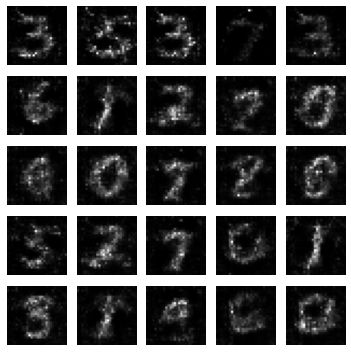


\epoch 621.000000 , ncv_G_Loss: 0.528459, cv_D_loss: 2.912752, cv_acc: 0.823500

\epoch 622.000000 , ncv_G_Loss: 0.159625, cv_D_loss: 2.999549, cv_acc: 0.847400

\epoch 623.000000 , ncv_G_Loss: 0.396885, cv_D_loss: 2.839543, cv_acc: 0.827900

\epoch 624.000000 , ncv_G_Loss: 0.762423, cv_D_loss: 3.141339, cv_acc: 0.786400

\epoch 625.000000 , ncv_G_Loss: 0.270662, cv_D_loss: 2.924039, cv_acc: 0.818800

\epoch 626.000000 , ncv_G_Loss: 0.461870, cv_D_loss: 2.795287, cv_acc: 0.834100

\epoch 627.000000 , ncv_G_Loss: 0.589475, cv_D_loss: 2.872744, cv_acc: 0.837100

\epoch 628.000000 , ncv_G_Loss: 1.256872, cv_D_loss: 3.793191, cv_acc: 0.842300

\epoch 629.000000 , ncv_G_Loss: 1.128277, cv_D_loss: 3.733838, cv_acc: 0.812200

\epoch 630.000000 , ncv_G_Loss: 0.343616, cv_D_loss: 2.713801, cv_acc: 0.840500


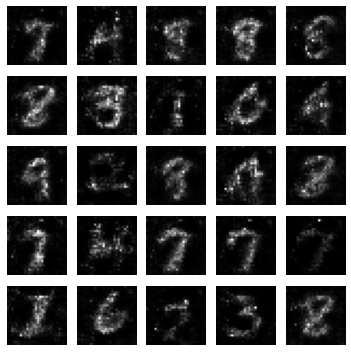


\epoch 631.000000 , ncv_G_Loss: 0.392868, cv_D_loss: 2.841931, cv_acc: 0.801000

\epoch 632.000000 , ncv_G_Loss: 0.229473, cv_D_loss: 2.849979, cv_acc: 0.839900

\epoch 633.000000 , ncv_G_Loss: 0.275122, cv_D_loss: 3.052427, cv_acc: 0.726200

\epoch 634.000000 , ncv_G_Loss: 0.509363, cv_D_loss: 2.818929, cv_acc: 0.832400

\epoch 635.000000 , ncv_G_Loss: 0.517903, cv_D_loss: 2.964363, cv_acc: 0.764600

\epoch 636.000000 , ncv_G_Loss: 0.405975, cv_D_loss: 3.005049, cv_acc: 0.801300

\epoch 637.000000 , ncv_G_Loss: 0.439004, cv_D_loss: 2.819902, cv_acc: 0.840100

\epoch 638.000000 , ncv_G_Loss: 0.569191, cv_D_loss: 2.749249, cv_acc: 0.809200

\epoch 639.000000 , ncv_G_Loss: 0.526450, cv_D_loss: 2.787027, cv_acc: 0.856200
Model saved

\epoch 640.000000 , ncv_G_Loss: 0.484324, cv_D_loss: 2.768760, cv_acc: 0.863500


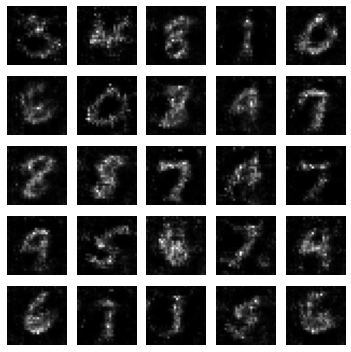


\epoch 641.000000 , ncv_G_Loss: 0.632770, cv_D_loss: 2.835634, cv_acc: 0.850300

\epoch 642.000000 , ncv_G_Loss: 0.572762, cv_D_loss: 2.961225, cv_acc: 0.803300

\epoch 643.000000 , ncv_G_Loss: 0.321239, cv_D_loss: 2.745707, cv_acc: 0.847100

\epoch 644.000000 , ncv_G_Loss: 0.585368, cv_D_loss: 2.800372, cv_acc: 0.854500

\epoch 645.000000 , ncv_G_Loss: 0.641065, cv_D_loss: 2.925521, cv_acc: 0.822100

\epoch 646.000000 , ncv_G_Loss: 0.463489, cv_D_loss: 2.714750, cv_acc: 0.854900

\epoch 647.000000 , ncv_G_Loss: 0.546353, cv_D_loss: 2.832753, cv_acc: 0.846100

\epoch 648.000000 , ncv_G_Loss: 0.539233, cv_D_loss: 2.826926, cv_acc: 0.840300

\epoch 649.000000 , ncv_G_Loss: 0.276658, cv_D_loss: 2.815981, cv_acc: 0.813500

\epoch 650.000000 , ncv_G_Loss: 0.203547, cv_D_loss: 2.883046, cv_acc: 0.845300


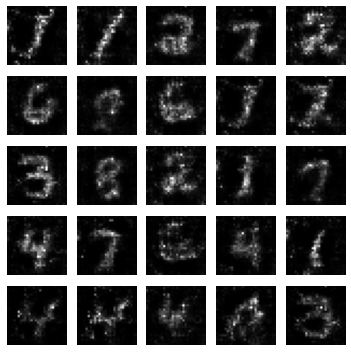


\epoch 651.000000 , ncv_G_Loss: 0.534315, cv_D_loss: 2.821678, cv_acc: 0.855300

\epoch 652.000000 , ncv_G_Loss: 1.078108, cv_D_loss: 3.878031, cv_acc: 0.532600

\epoch 653.000000 , ncv_G_Loss: 0.777582, cv_D_loss: 3.030310, cv_acc: 0.851800

\epoch 654.000000 , ncv_G_Loss: 0.619404, cv_D_loss: 3.408100, cv_acc: 0.610300

\epoch 655.000000 , ncv_G_Loss: 1.441463, cv_D_loss: 4.291233, cv_acc: 0.702900

\epoch 656.000000 , ncv_G_Loss: 1.247644, cv_D_loss: 3.939695, cv_acc: 0.773100

\epoch 657.000000 , ncv_G_Loss: 0.670430, cv_D_loss: 2.901918, cv_acc: 0.847700

\epoch 658.000000 , ncv_G_Loss: 0.307639, cv_D_loss: 2.772310, cv_acc: 0.831900

\epoch 659.000000 , ncv_G_Loss: 0.411130, cv_D_loss: 2.950383, cv_acc: 0.778900

\epoch 660.000000 , ncv_G_Loss: 0.712110, cv_D_loss: 2.879867, cv_acc: 0.861700


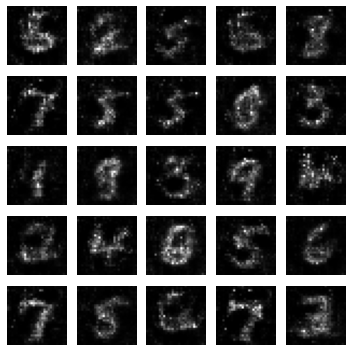


\epoch 661.000000 , ncv_G_Loss: 0.381042, cv_D_loss: 2.670618, cv_acc: 0.855800

\epoch 662.000000 , ncv_G_Loss: 0.745222, cv_D_loss: 3.499540, cv_acc: 0.715000

\epoch 663.000000 , ncv_G_Loss: 0.579052, cv_D_loss: 2.797633, cv_acc: 0.850600

\epoch 664.000000 , ncv_G_Loss: 1.089839, cv_D_loss: 3.534036, cv_acc: 0.819100

\epoch 665.000000 , ncv_G_Loss: 0.361454, cv_D_loss: 2.748485, cv_acc: 0.847000
Model saved

\epoch 666.000000 , ncv_G_Loss: 0.537892, cv_D_loss: 2.737544, cv_acc: 0.866800

\epoch 667.000000 , ncv_G_Loss: 0.270946, cv_D_loss: 2.751467, cv_acc: 0.856800

\epoch 668.000000 , ncv_G_Loss: 0.846146, cv_D_loss: 3.161222, cv_acc: 0.833800

\epoch 669.000000 , ncv_G_Loss: 0.913272, cv_D_loss: 3.185725, cv_acc: 0.842100

\epoch 670.000000 , ncv_G_Loss: 0.745203, cv_D_loss: 3.357793, cv_acc: 0.674300


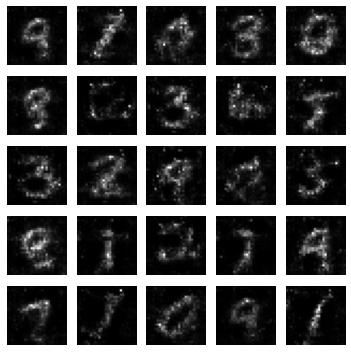


\epoch 671.000000 , ncv_G_Loss: 0.293342, cv_D_loss: 2.821261, cv_acc: 0.830700

\epoch 672.000000 , ncv_G_Loss: 0.281226, cv_D_loss: 2.918186, cv_acc: 0.769600

\epoch 673.000000 , ncv_G_Loss: 0.822446, cv_D_loss: 3.296315, cv_acc: 0.781200

\epoch 674.000000 , ncv_G_Loss: 0.408931, cv_D_loss: 2.900134, cv_acc: 0.777300

\epoch 675.000000 , ncv_G_Loss: 0.282444, cv_D_loss: 2.900888, cv_acc: 0.788700

\epoch 676.000000 , ncv_G_Loss: 0.388888, cv_D_loss: 2.760287, cv_acc: 0.837500

\epoch 677.000000 , ncv_G_Loss: 0.438047, cv_D_loss: 2.713854, cv_acc: 0.861400

\epoch 678.000000 , ncv_G_Loss: 0.695312, cv_D_loss: 2.923383, cv_acc: 0.853400

\epoch 679.000000 , ncv_G_Loss: 0.612093, cv_D_loss: 2.866198, cv_acc: 0.849500

\epoch 680.000000 , ncv_G_Loss: 0.754478, cv_D_loss: 3.037094, cv_acc: 0.854800


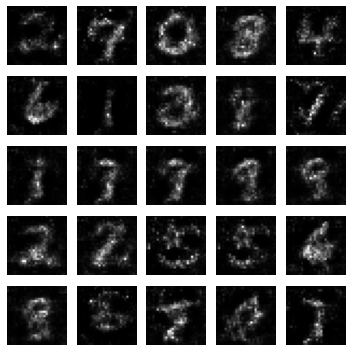


\epoch 681.000000 , ncv_G_Loss: 0.410083, cv_D_loss: 2.692888, cv_acc: 0.851900

\epoch 682.000000 , ncv_G_Loss: 0.856932, cv_D_loss: 4.000102, cv_acc: 0.468200

\epoch 683.000000 , ncv_G_Loss: 0.624733, cv_D_loss: 3.158569, cv_acc: 0.722600

\epoch 684.000000 , ncv_G_Loss: 0.346792, cv_D_loss: 2.731271, cv_acc: 0.851200

\epoch 685.000000 , ncv_G_Loss: 0.671267, cv_D_loss: 2.881768, cv_acc: 0.863100

\epoch 686.000000 , ncv_G_Loss: 0.275616, cv_D_loss: 2.727205, cv_acc: 0.859800

\epoch 687.000000 , ncv_G_Loss: 0.726538, cv_D_loss: 3.085121, cv_acc: 0.812900

\epoch 688.000000 , ncv_G_Loss: 0.455322, cv_D_loss: 3.017936, cv_acc: 0.770000

\epoch 689.000000 , ncv_G_Loss: 0.343899, cv_D_loss: 2.938989, cv_acc: 0.764900

\epoch 690.000000 , ncv_G_Loss: 0.408064, cv_D_loss: 2.725617, cv_acc: 0.845100


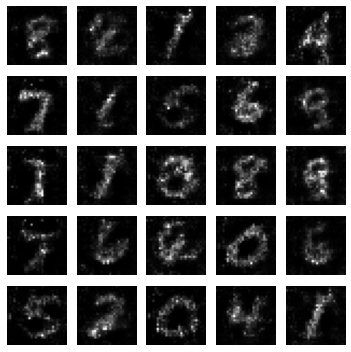


\epoch 691.000000 , ncv_G_Loss: 0.499795, cv_D_loss: 2.982773, cv_acc: 0.745400

\epoch 692.000000 , ncv_G_Loss: 0.482239, cv_D_loss: 2.905431, cv_acc: 0.812300

\epoch 693.000000 , ncv_G_Loss: 0.364186, cv_D_loss: 2.872040, cv_acc: 0.803000

\epoch 694.000000 , ncv_G_Loss: 0.778800, cv_D_loss: 3.040745, cv_acc: 0.859300

\epoch 695.000000 , ncv_G_Loss: 0.628231, cv_D_loss: 2.919901, cv_acc: 0.813300

\epoch 696.000000 , ncv_G_Loss: 0.654949, cv_D_loss: 3.000206, cv_acc: 0.826200

\epoch 697.000000 , ncv_G_Loss: 0.277520, cv_D_loss: 2.896706, cv_acc: 0.814900

\epoch 698.000000 , ncv_G_Loss: 0.478629, cv_D_loss: 2.807927, cv_acc: 0.829600

\epoch 699.000000 , ncv_G_Loss: 0.640504, cv_D_loss: 2.902555, cv_acc: 0.859600

\epoch 700.000000 , ncv_G_Loss: 0.763480, cv_D_loss: 3.020835, cv_acc: 0.854100


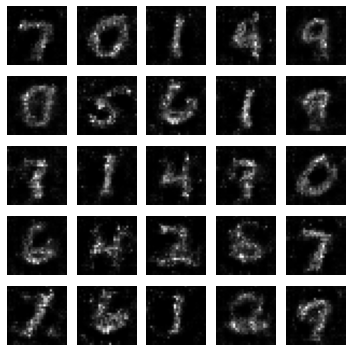


\epoch 701.000000 , ncv_G_Loss: 0.261975, cv_D_loss: 2.966052, cv_acc: 0.776100

\epoch 702.000000 , ncv_G_Loss: 0.602658, cv_D_loss: 2.797131, cv_acc: 0.858900

\epoch 703.000000 , ncv_G_Loss: 0.443333, cv_D_loss: 2.701937, cv_acc: 0.861200

\epoch 704.000000 , ncv_G_Loss: 1.020415, cv_D_loss: 3.340922, cv_acc: 0.854400

\epoch 705.000000 , ncv_G_Loss: 0.261424, cv_D_loss: 2.902882, cv_acc: 0.794900

\epoch 706.000000 , ncv_G_Loss: 0.815030, cv_D_loss: 3.070575, cv_acc: 0.845600

\epoch 707.000000 , ncv_G_Loss: 0.275279, cv_D_loss: 2.805498, cv_acc: 0.847200

\epoch 708.000000 , ncv_G_Loss: 0.571463, cv_D_loss: 2.946198, cv_acc: 0.825900

\epoch 709.000000 , ncv_G_Loss: 0.610771, cv_D_loss: 2.862993, cv_acc: 0.862400

\epoch 710.000000 , ncv_G_Loss: 0.903731, cv_D_loss: 3.189084, cv_acc: 0.816300


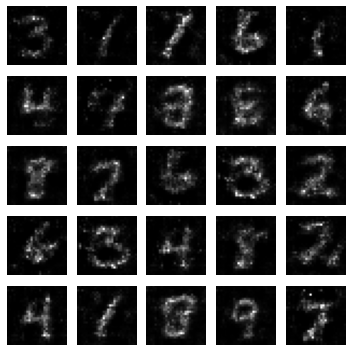


\epoch 711.000000 , ncv_G_Loss: 0.700757, cv_D_loss: 3.403438, cv_acc: 0.515700

\epoch 712.000000 , ncv_G_Loss: 1.311212, cv_D_loss: 4.055305, cv_acc: 0.734400

\epoch 713.000000 , ncv_G_Loss: 0.933084, cv_D_loss: 3.567335, cv_acc: 0.775200

\epoch 714.000000 , ncv_G_Loss: 0.567576, cv_D_loss: 2.774794, cv_acc: 0.848400

\epoch 715.000000 , ncv_G_Loss: 0.226173, cv_D_loss: 2.862748, cv_acc: 0.826900

\epoch 716.000000 , ncv_G_Loss: 0.762656, cv_D_loss: 3.530998, cv_acc: 0.549900

\epoch 717.000000 , ncv_G_Loss: 0.383747, cv_D_loss: 2.756680, cv_acc: 0.836700

\epoch 718.000000 , ncv_G_Loss: 1.094349, cv_D_loss: 3.873318, cv_acc: 0.619700

\epoch 719.000000 , ncv_G_Loss: 0.251728, cv_D_loss: 2.774554, cv_acc: 0.847000

\epoch 720.000000 , ncv_G_Loss: 0.338836, cv_D_loss: 2.719489, cv_acc: 0.851900


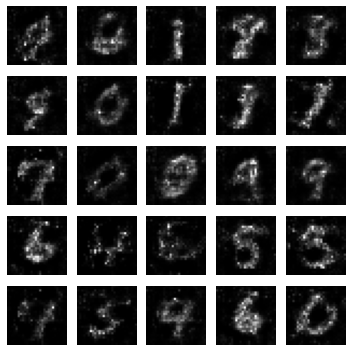


\epoch 721.000000 , ncv_G_Loss: 0.668719, cv_D_loss: 2.880676, cv_acc: 0.842200

\epoch 722.000000 , ncv_G_Loss: 0.589608, cv_D_loss: 2.797618, cv_acc: 0.850300

\epoch 723.000000 , ncv_G_Loss: 0.318391, cv_D_loss: 2.764019, cv_acc: 0.839100

\epoch 724.000000 , ncv_G_Loss: 0.192100, cv_D_loss: 2.877131, cv_acc: 0.832400

\epoch 725.000000 , ncv_G_Loss: 0.342195, cv_D_loss: 2.697687, cv_acc: 0.846800

\epoch 726.000000 , ncv_G_Loss: 0.422380, cv_D_loss: 3.215584, cv_acc: 0.517800

\epoch 727.000000 , ncv_G_Loss: 0.380055, cv_D_loss: 2.679260, cv_acc: 0.861100

\epoch 728.000000 , ncv_G_Loss: 0.696290, cv_D_loss: 2.864248, cv_acc: 0.860300

\epoch 729.000000 , ncv_G_Loss: 0.930004, cv_D_loss: 3.221000, cv_acc: 0.850600

\epoch 730.000000 , ncv_G_Loss: 0.577689, cv_D_loss: 2.730008, cv_acc: 0.858800


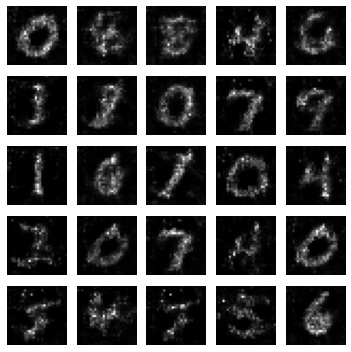


\epoch 731.000000 , ncv_G_Loss: 0.396596, cv_D_loss: 2.689004, cv_acc: 0.839000

\epoch 732.000000 , ncv_G_Loss: 0.329988, cv_D_loss: 2.692646, cv_acc: 0.849300

\epoch 733.000000 , ncv_G_Loss: 0.526952, cv_D_loss: 2.861617, cv_acc: 0.820900

\epoch 734.000000 , ncv_G_Loss: 0.631950, cv_D_loss: 2.850048, cv_acc: 0.852500

\epoch 735.000000 , ncv_G_Loss: 0.551621, cv_D_loss: 3.096678, cv_acc: 0.766600

\epoch 736.000000 , ncv_G_Loss: 0.411053, cv_D_loss: 2.741913, cv_acc: 0.815400

\epoch 737.000000 , ncv_G_Loss: 0.323075, cv_D_loss: 2.704183, cv_acc: 0.864500

\epoch 738.000000 , ncv_G_Loss: 0.633664, cv_D_loss: 2.851873, cv_acc: 0.836500

\epoch 739.000000 , ncv_G_Loss: 0.448732, cv_D_loss: 2.805243, cv_acc: 0.817400

\epoch 740.000000 , ncv_G_Loss: 0.531049, cv_D_loss: 2.764906, cv_acc: 0.859900


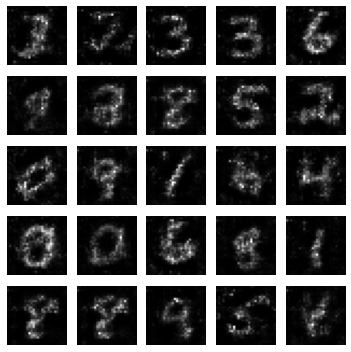


\epoch 741.000000 , ncv_G_Loss: 0.558079, cv_D_loss: 2.702391, cv_acc: 0.856100

\epoch 742.000000 , ncv_G_Loss: 0.464428, cv_D_loss: 2.691023, cv_acc: 0.848300

\epoch 743.000000 , ncv_G_Loss: 0.552701, cv_D_loss: 2.831717, cv_acc: 0.840200

\epoch 744.000000 , ncv_G_Loss: 0.667754, cv_D_loss: 2.814945, cv_acc: 0.827900

\epoch 745.000000 , ncv_G_Loss: 0.413473, cv_D_loss: 3.054318, cv_acc: 0.711100

\epoch 746.000000 , ncv_G_Loss: 0.675124, cv_D_loss: 3.245076, cv_acc: 0.611400

\epoch 747.000000 , ncv_G_Loss: 0.500764, cv_D_loss: 2.795078, cv_acc: 0.853400

\epoch 748.000000 , ncv_G_Loss: 0.512631, cv_D_loss: 3.183788, cv_acc: 0.695500

\epoch 749.000000 , ncv_G_Loss: 0.453825, cv_D_loss: 2.741833, cv_acc: 0.849900

\epoch 750.000000 , ncv_G_Loss: 0.209077, cv_D_loss: 2.788312, cv_acc: 0.847800


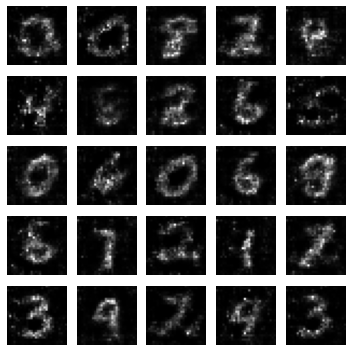


\epoch 751.000000 , ncv_G_Loss: 0.296519, cv_D_loss: 2.696493, cv_acc: 0.863700

\epoch 752.000000 , ncv_G_Loss: 0.639714, cv_D_loss: 3.126032, cv_acc: 0.769000

\epoch 753.000000 , ncv_G_Loss: 0.432956, cv_D_loss: 2.656066, cv_acc: 0.851200

\epoch 754.000000 , ncv_G_Loss: 0.446829, cv_D_loss: 2.736261, cv_acc: 0.840800

\epoch 755.000000 , ncv_G_Loss: 0.920917, cv_D_loss: 3.390818, cv_acc: 0.758900

\epoch 756.000000 , ncv_G_Loss: 0.440765, cv_D_loss: 2.997281, cv_acc: 0.727500

\epoch 757.000000 , ncv_G_Loss: 0.407032, cv_D_loss: 2.711556, cv_acc: 0.854800

\epoch 758.000000 , ncv_G_Loss: 0.262774, cv_D_loss: 2.907004, cv_acc: 0.790700

\epoch 759.000000 , ncv_G_Loss: 0.274301, cv_D_loss: 3.046763, cv_acc: 0.714400

\epoch 760.000000 , ncv_G_Loss: 0.584645, cv_D_loss: 2.743115, cv_acc: 0.858200


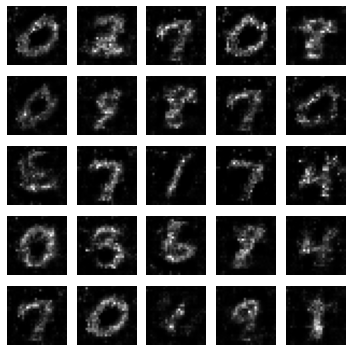


\epoch 761.000000 , ncv_G_Loss: 0.630944, cv_D_loss: 2.978541, cv_acc: 0.819100

\epoch 762.000000 , ncv_G_Loss: 0.758825, cv_D_loss: 3.104809, cv_acc: 0.715000

\epoch 763.000000 , ncv_G_Loss: 1.146148, cv_D_loss: 3.625751, cv_acc: 0.839500

\epoch 764.000000 , ncv_G_Loss: 0.640364, cv_D_loss: 3.147310, cv_acc: 0.713600

\epoch 765.000000 , ncv_G_Loss: 0.784140, cv_D_loss: 3.073101, cv_acc: 0.809900

\epoch 766.000000 , ncv_G_Loss: 0.534129, cv_D_loss: 2.771433, cv_acc: 0.830800
Model saved

\epoch 767.000000 , ncv_G_Loss: 0.256166, cv_D_loss: 2.732928, cv_acc: 0.867300

\epoch 768.000000 , ncv_G_Loss: 0.477240, cv_D_loss: 2.757004, cv_acc: 0.832600

\epoch 769.000000 , ncv_G_Loss: 0.555375, cv_D_loss: 2.718007, cv_acc: 0.862600

\epoch 770.000000 , ncv_G_Loss: 0.401611, cv_D_loss: 2.694487, cv_acc: 0.850300


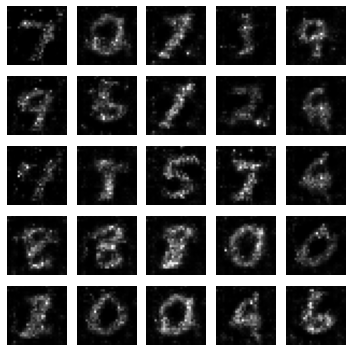


\epoch 771.000000 , ncv_G_Loss: 0.981881, cv_D_loss: 3.217223, cv_acc: 0.844100

\epoch 772.000000 , ncv_G_Loss: 0.254962, cv_D_loss: 2.707611, cv_acc: 0.860300

\epoch 773.000000 , ncv_G_Loss: 0.467790, cv_D_loss: 2.737158, cv_acc: 0.842800

\epoch 774.000000 , ncv_G_Loss: 0.453240, cv_D_loss: 2.715230, cv_acc: 0.854400

\epoch 775.000000 , ncv_G_Loss: 0.599020, cv_D_loss: 2.973861, cv_acc: 0.822500

\epoch 776.000000 , ncv_G_Loss: 0.617719, cv_D_loss: 2.824772, cv_acc: 0.845000

\epoch 777.000000 , ncv_G_Loss: 0.412199, cv_D_loss: 2.936001, cv_acc: 0.776500

\epoch 778.000000 , ncv_G_Loss: 0.443930, cv_D_loss: 2.763876, cv_acc: 0.840600

\epoch 779.000000 , ncv_G_Loss: 0.371527, cv_D_loss: 2.651920, cv_acc: 0.842700

\epoch 780.000000 , ncv_G_Loss: 0.778671, cv_D_loss: 3.223185, cv_acc: 0.723500


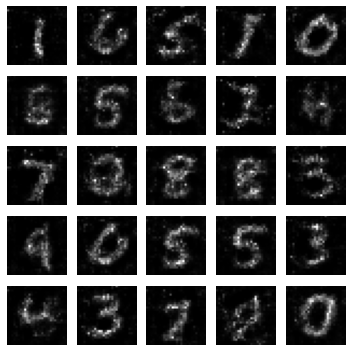


\epoch 781.000000 , ncv_G_Loss: 0.667172, cv_D_loss: 2.889254, cv_acc: 0.853000
Model saved

\epoch 782.000000 , ncv_G_Loss: 0.470439, cv_D_loss: 2.651218, cv_acc: 0.870800

\epoch 783.000000 , ncv_G_Loss: 0.401859, cv_D_loss: 3.119124, cv_acc: 0.680800

\epoch 784.000000 , ncv_G_Loss: 0.820168, cv_D_loss: 3.256916, cv_acc: 0.728900

\epoch 785.000000 , ncv_G_Loss: 0.509987, cv_D_loss: 2.764424, cv_acc: 0.834800

\epoch 786.000000 , ncv_G_Loss: 0.306703, cv_D_loss: 2.616730, cv_acc: 0.869000

\epoch 787.000000 , ncv_G_Loss: 0.631735, cv_D_loss: 2.817498, cv_acc: 0.820400

\epoch 788.000000 , ncv_G_Loss: 0.845011, cv_D_loss: 3.337429, cv_acc: 0.689600

\epoch 789.000000 , ncv_G_Loss: 0.909663, cv_D_loss: 3.410821, cv_acc: 0.802400

\epoch 790.000000 , ncv_G_Loss: 0.727337, cv_D_loss: 3.216192, cv_acc: 0.705300


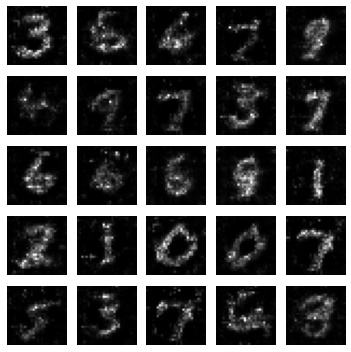


\epoch 791.000000 , ncv_G_Loss: 0.596499, cv_D_loss: 2.792667, cv_acc: 0.846900

\epoch 792.000000 , ncv_G_Loss: 0.566443, cv_D_loss: 2.726897, cv_acc: 0.866500

\epoch 793.000000 , ncv_G_Loss: 0.469349, cv_D_loss: 2.662789, cv_acc: 0.870400

\epoch 794.000000 , ncv_G_Loss: 0.391314, cv_D_loss: 2.658669, cv_acc: 0.867500

\epoch 795.000000 , ncv_G_Loss: 0.330743, cv_D_loss: 2.710278, cv_acc: 0.847600

\epoch 796.000000 , ncv_G_Loss: 0.327686, cv_D_loss: 2.697487, cv_acc: 0.864000

\epoch 797.000000 , ncv_G_Loss: 0.574945, cv_D_loss: 2.753330, cv_acc: 0.861100
Model saved

\epoch 798.000000 , ncv_G_Loss: 0.863288, cv_D_loss: 3.073140, cv_acc: 0.873300

\epoch 799.000000 , ncv_G_Loss: 0.664210, cv_D_loss: 2.877136, cv_acc: 0.857100

\epoch 800.000000 , ncv_G_Loss: 0.692286, cv_D_loss: 2.903685, cv_acc: 0.845600


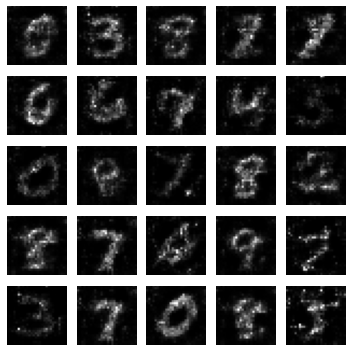


\epoch 801.000000 , ncv_G_Loss: 0.326237, cv_D_loss: 2.699967, cv_acc: 0.844900

\epoch 802.000000 , ncv_G_Loss: 0.662761, cv_D_loss: 2.857984, cv_acc: 0.864200

\epoch 803.000000 , ncv_G_Loss: 0.522975, cv_D_loss: 2.737752, cv_acc: 0.868000

\epoch 804.000000 , ncv_G_Loss: 0.507354, cv_D_loss: 2.757165, cv_acc: 0.831200

\epoch 805.000000 , ncv_G_Loss: 0.813672, cv_D_loss: 3.226111, cv_acc: 0.791100

\epoch 806.000000 , ncv_G_Loss: 0.598239, cv_D_loss: 2.745621, cv_acc: 0.871500

\epoch 807.000000 , ncv_G_Loss: 0.476925, cv_D_loss: 2.731074, cv_acc: 0.847600

\epoch 808.000000 , ncv_G_Loss: 0.456054, cv_D_loss: 2.791196, cv_acc: 0.818400

\epoch 809.000000 , ncv_G_Loss: 0.527157, cv_D_loss: 2.698521, cv_acc: 0.867000

\epoch 810.000000 , ncv_G_Loss: 0.452644, cv_D_loss: 3.381264, cv_acc: 0.630900


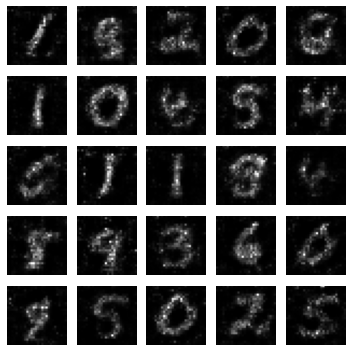


\epoch 811.000000 , ncv_G_Loss: 0.530733, cv_D_loss: 2.714613, cv_acc: 0.848400

\epoch 812.000000 , ncv_G_Loss: 0.511177, cv_D_loss: 2.795599, cv_acc: 0.824500

\epoch 813.000000 , ncv_G_Loss: 0.309480, cv_D_loss: 2.729693, cv_acc: 0.863100

\epoch 814.000000 , ncv_G_Loss: 0.528241, cv_D_loss: 2.790130, cv_acc: 0.816700

\epoch 815.000000 , ncv_G_Loss: 1.265602, cv_D_loss: 3.809389, cv_acc: 0.831900

\epoch 816.000000 , ncv_G_Loss: 0.304255, cv_D_loss: 2.909179, cv_acc: 0.772700

\epoch 817.000000 , ncv_G_Loss: 0.414397, cv_D_loss: 2.599322, cv_acc: 0.869000

\epoch 818.000000 , ncv_G_Loss: 0.661717, cv_D_loss: 2.869493, cv_acc: 0.857000

\epoch 819.000000 , ncv_G_Loss: 0.752863, cv_D_loss: 3.119221, cv_acc: 0.776800

\epoch 820.000000 , ncv_G_Loss: 0.404486, cv_D_loss: 2.713469, cv_acc: 0.859300


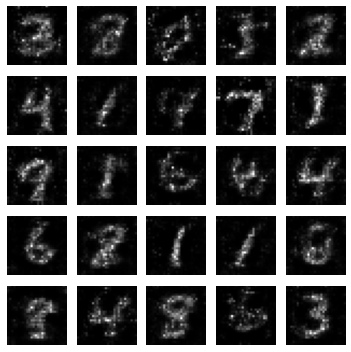


\epoch 821.000000 , ncv_G_Loss: 0.882147, cv_D_loss: 3.099058, cv_acc: 0.861300

\epoch 822.000000 , ncv_G_Loss: 0.784029, cv_D_loss: 3.196542, cv_acc: 0.754900

\epoch 823.000000 , ncv_G_Loss: 0.272757, cv_D_loss: 2.725793, cv_acc: 0.859800

\epoch 824.000000 , ncv_G_Loss: 0.407660, cv_D_loss: 2.953491, cv_acc: 0.764900

\epoch 825.000000 , ncv_G_Loss: 0.250318, cv_D_loss: 2.774507, cv_acc: 0.859800

\epoch 826.000000 , ncv_G_Loss: 0.217357, cv_D_loss: 2.784024, cv_acc: 0.850500

\epoch 827.000000 , ncv_G_Loss: 0.731670, cv_D_loss: 2.986203, cv_acc: 0.845100

\epoch 828.000000 , ncv_G_Loss: 0.406087, cv_D_loss: 2.681535, cv_acc: 0.854700

\epoch 829.000000 , ncv_G_Loss: 0.565970, cv_D_loss: 2.776344, cv_acc: 0.872000

\epoch 830.000000 , ncv_G_Loss: 0.513237, cv_D_loss: 2.651431, cv_acc: 0.871500


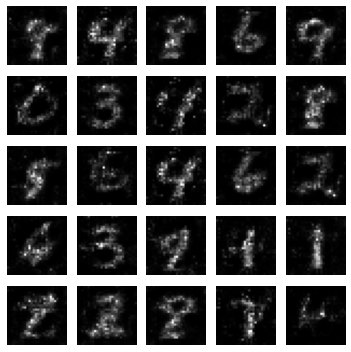

Model saved

\epoch 831.000000 , ncv_G_Loss: 0.399904, cv_D_loss: 2.591542, cv_acc: 0.873800

\epoch 832.000000 , ncv_G_Loss: 0.502025, cv_D_loss: 2.693995, cv_acc: 0.872400

\epoch 833.000000 , ncv_G_Loss: 0.208353, cv_D_loss: 3.305607, cv_acc: 0.651000

\epoch 834.000000 , ncv_G_Loss: 1.556156, cv_D_loss: 4.498395, cv_acc: 0.566900

\epoch 835.000000 , ncv_G_Loss: 0.395888, cv_D_loss: 2.649665, cv_acc: 0.862900

\epoch 836.000000 , ncv_G_Loss: 0.483067, cv_D_loss: 2.688802, cv_acc: 0.846000

\epoch 837.000000 , ncv_G_Loss: 0.883374, cv_D_loss: 3.315535, cv_acc: 0.800000
Model saved

\epoch 838.000000 , ncv_G_Loss: 0.508219, cv_D_loss: 2.665308, cv_acc: 0.876300

\epoch 839.000000 , ncv_G_Loss: 0.376563, cv_D_loss: 2.709871, cv_acc: 0.842500

\epoch 840.000000 , ncv_G_Loss: 0.548155, cv_D_loss: 2.832489, cv_acc: 0.855900


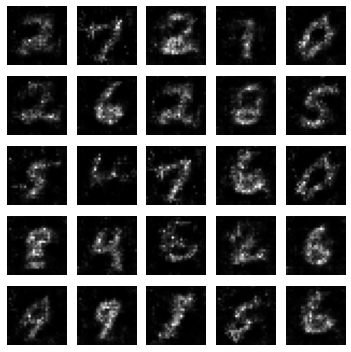


\epoch 841.000000 , ncv_G_Loss: 1.208863, cv_D_loss: 3.779902, cv_acc: 0.717200

\epoch 842.000000 , ncv_G_Loss: 0.920344, cv_D_loss: 3.198035, cv_acc: 0.839400

\epoch 843.000000 , ncv_G_Loss: 0.991181, cv_D_loss: 3.364136, cv_acc: 0.821000

\epoch 844.000000 , ncv_G_Loss: 0.765494, cv_D_loss: 3.053565, cv_acc: 0.841700

\epoch 845.000000 , ncv_G_Loss: 0.428857, cv_D_loss: 2.963082, cv_acc: 0.767800

\epoch 846.000000 , ncv_G_Loss: 0.519090, cv_D_loss: 2.768008, cv_acc: 0.838100

\epoch 847.000000 , ncv_G_Loss: 1.356228, cv_D_loss: 4.026037, cv_acc: 0.729300

\epoch 848.000000 , ncv_G_Loss: 0.358358, cv_D_loss: 2.925664, cv_acc: 0.732000
Model saved

\epoch 849.000000 , ncv_G_Loss: 0.383776, cv_D_loss: 2.623044, cv_acc: 0.877900

\epoch 850.000000 , ncv_G_Loss: 0.561718, cv_D_loss: 2.718130, cv_acc: 0.868600


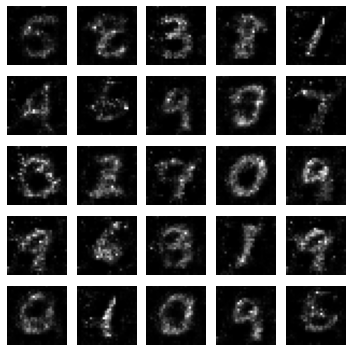


\epoch 851.000000 , ncv_G_Loss: 0.537548, cv_D_loss: 2.712358, cv_acc: 0.865500

\epoch 852.000000 , ncv_G_Loss: 0.337627, cv_D_loss: 2.640112, cv_acc: 0.860500

\epoch 853.000000 , ncv_G_Loss: 0.411972, cv_D_loss: 3.371003, cv_acc: 0.612200

\epoch 854.000000 , ncv_G_Loss: 0.584342, cv_D_loss: 2.781448, cv_acc: 0.845400

\epoch 855.000000 , ncv_G_Loss: 0.703183, cv_D_loss: 2.906490, cv_acc: 0.843400

\epoch 856.000000 , ncv_G_Loss: 0.738203, cv_D_loss: 2.964562, cv_acc: 0.852800

\epoch 857.000000 , ncv_G_Loss: 0.341106, cv_D_loss: 2.664752, cv_acc: 0.856900

\epoch 858.000000 , ncv_G_Loss: 0.398022, cv_D_loss: 2.654782, cv_acc: 0.871700

\epoch 859.000000 , ncv_G_Loss: 0.298522, cv_D_loss: 2.690287, cv_acc: 0.861200

\epoch 860.000000 , ncv_G_Loss: 0.468475, cv_D_loss: 2.677421, cv_acc: 0.863900


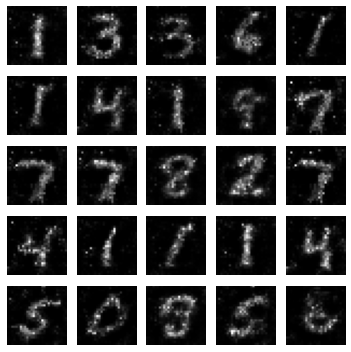


\epoch 861.000000 , ncv_G_Loss: 0.441239, cv_D_loss: 2.677776, cv_acc: 0.867900
Model saved

\epoch 862.000000 , ncv_G_Loss: 0.477459, cv_D_loss: 2.680820, cv_acc: 0.879500

\epoch 863.000000 , ncv_G_Loss: 0.305506, cv_D_loss: 2.734136, cv_acc: 0.851300

\epoch 864.000000 , ncv_G_Loss: 0.676343, cv_D_loss: 2.879108, cv_acc: 0.835300

\epoch 865.000000 , ncv_G_Loss: 0.466885, cv_D_loss: 3.015453, cv_acc: 0.703200

\epoch 866.000000 , ncv_G_Loss: 0.174265, cv_D_loss: 2.918627, cv_acc: 0.846600

\epoch 867.000000 , ncv_G_Loss: 0.557653, cv_D_loss: 3.375242, cv_acc: 0.594800

\epoch 868.000000 , ncv_G_Loss: 0.628278, cv_D_loss: 3.145106, cv_acc: 0.623800

\epoch 869.000000 , ncv_G_Loss: 0.608145, cv_D_loss: 2.787335, cv_acc: 0.875500

\epoch 870.000000 , ncv_G_Loss: 0.193202, cv_D_loss: 2.798165, cv_acc: 0.872200


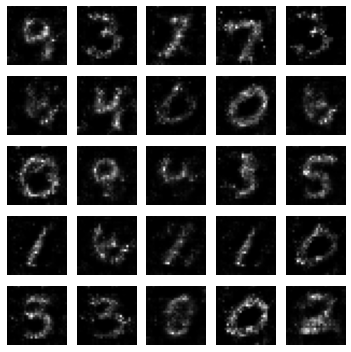


\epoch 871.000000 , ncv_G_Loss: 0.336075, cv_D_loss: 2.658261, cv_acc: 0.859400

\epoch 872.000000 , ncv_G_Loss: 0.968693, cv_D_loss: 3.310440, cv_acc: 0.859800

\epoch 873.000000 , ncv_G_Loss: 0.374482, cv_D_loss: 2.700928, cv_acc: 0.834600

\epoch 874.000000 , ncv_G_Loss: 1.398960, cv_D_loss: 4.696066, cv_acc: 0.501500

\epoch 875.000000 , ncv_G_Loss: 0.545532, cv_D_loss: 2.792101, cv_acc: 0.831200

\epoch 876.000000 , ncv_G_Loss: 0.833840, cv_D_loss: 3.053284, cv_acc: 0.852500

\epoch 877.000000 , ncv_G_Loss: 0.326995, cv_D_loss: 2.720013, cv_acc: 0.799400

\epoch 878.000000 , ncv_G_Loss: 0.432323, cv_D_loss: 2.692201, cv_acc: 0.839500

\epoch 879.000000 , ncv_G_Loss: 0.345288, cv_D_loss: 2.623879, cv_acc: 0.844100

\epoch 880.000000 , ncv_G_Loss: 0.543114, cv_D_loss: 2.787018, cv_acc: 0.850200


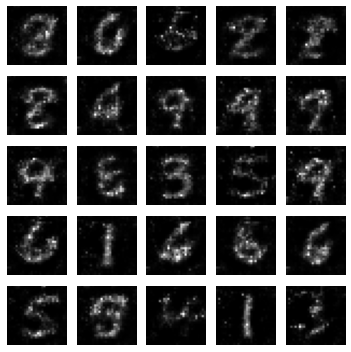


\epoch 881.000000 , ncv_G_Loss: 0.236377, cv_D_loss: 2.841776, cv_acc: 0.827300

\epoch 882.000000 , ncv_G_Loss: 0.969934, cv_D_loss: 3.642395, cv_acc: 0.612900

\epoch 883.000000 , ncv_G_Loss: 0.617061, cv_D_loss: 2.868714, cv_acc: 0.823200

\epoch 884.000000 , ncv_G_Loss: 1.180966, cv_D_loss: 4.207679, cv_acc: 0.616800

\epoch 885.000000 , ncv_G_Loss: 0.554700, cv_D_loss: 2.816460, cv_acc: 0.764200

\epoch 886.000000 , ncv_G_Loss: 0.844271, cv_D_loss: 3.169183, cv_acc: 0.833900

\epoch 887.000000 , ncv_G_Loss: 0.610878, cv_D_loss: 2.790451, cv_acc: 0.851900

\epoch 888.000000 , ncv_G_Loss: 0.600912, cv_D_loss: 3.226246, cv_acc: 0.574300

\epoch 889.000000 , ncv_G_Loss: 0.527670, cv_D_loss: 2.778505, cv_acc: 0.839500

\epoch 890.000000 , ncv_G_Loss: 0.798601, cv_D_loss: 3.014283, cv_acc: 0.844500


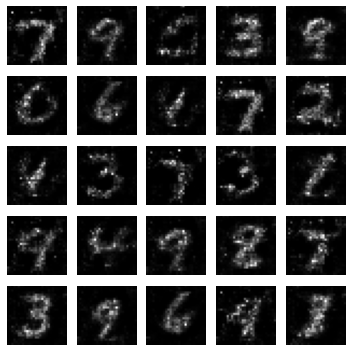


\epoch 891.000000 , ncv_G_Loss: 0.529541, cv_D_loss: 2.944551, cv_acc: 0.803800

\epoch 892.000000 , ncv_G_Loss: 0.297758, cv_D_loss: 2.719196, cv_acc: 0.846400

\epoch 893.000000 , ncv_G_Loss: 0.663683, cv_D_loss: 2.762089, cv_acc: 0.866600

\epoch 894.000000 , ncv_G_Loss: 0.417560, cv_D_loss: 2.721449, cv_acc: 0.829300

\epoch 895.000000 , ncv_G_Loss: 1.105716, cv_D_loss: 3.407462, cv_acc: 0.845100

\epoch 896.000000 , ncv_G_Loss: 0.226771, cv_D_loss: 3.090953, cv_acc: 0.723900

\epoch 897.000000 , ncv_G_Loss: 0.775240, cv_D_loss: 2.977853, cv_acc: 0.839100

\epoch 898.000000 , ncv_G_Loss: 0.615485, cv_D_loss: 2.751867, cv_acc: 0.874900

\epoch 899.000000 , ncv_G_Loss: 0.824667, cv_D_loss: 3.152567, cv_acc: 0.838800

\epoch 900.000000 , ncv_G_Loss: 0.364311, cv_D_loss: 2.643402, cv_acc: 0.863600


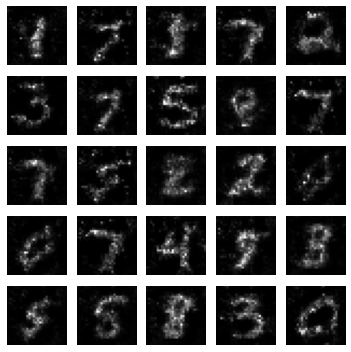


\epoch 901.000000 , ncv_G_Loss: 0.373960, cv_D_loss: 2.658042, cv_acc: 0.852400

\epoch 902.000000 , ncv_G_Loss: 0.461023, cv_D_loss: 2.672300, cv_acc: 0.867300

\epoch 903.000000 , ncv_G_Loss: 1.156060, cv_D_loss: 3.553683, cv_acc: 0.835500

\epoch 904.000000 , ncv_G_Loss: 0.240958, cv_D_loss: 2.669953, cv_acc: 0.869400

\epoch 905.000000 , ncv_G_Loss: 0.853084, cv_D_loss: 3.138187, cv_acc: 0.821700

\epoch 906.000000 , ncv_G_Loss: 0.279932, cv_D_loss: 2.709476, cv_acc: 0.847400

\epoch 907.000000 , ncv_G_Loss: 0.667745, cv_D_loss: 3.233440, cv_acc: 0.632900

\epoch 908.000000 , ncv_G_Loss: 0.500917, cv_D_loss: 2.638817, cv_acc: 0.874400

\epoch 909.000000 , ncv_G_Loss: 1.105676, cv_D_loss: 3.730968, cv_acc: 0.662100

\epoch 910.000000 , ncv_G_Loss: 0.553682, cv_D_loss: 2.704681, cv_acc: 0.873300


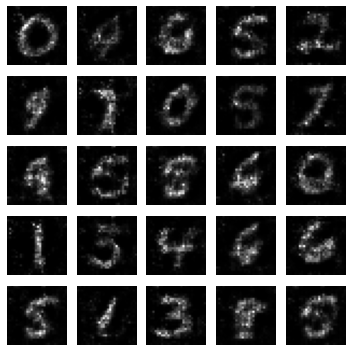


\epoch 911.000000 , ncv_G_Loss: 0.576614, cv_D_loss: 2.993138, cv_acc: 0.749600

\epoch 912.000000 , ncv_G_Loss: 1.359358, cv_D_loss: 5.027888, cv_acc: 0.387300

\epoch 913.000000 , ncv_G_Loss: 0.565315, cv_D_loss: 2.767460, cv_acc: 0.865200

\epoch 914.000000 , ncv_G_Loss: 0.472644, cv_D_loss: 2.639389, cv_acc: 0.863400

\epoch 915.000000 , ncv_G_Loss: 0.591968, cv_D_loss: 2.736899, cv_acc: 0.873800

\epoch 916.000000 , ncv_G_Loss: 0.831179, cv_D_loss: 3.123874, cv_acc: 0.832700

\epoch 917.000000 , ncv_G_Loss: 1.243705, cv_D_loss: 4.499057, cv_acc: 0.424400

\epoch 918.000000 , ncv_G_Loss: 0.378668, cv_D_loss: 2.617292, cv_acc: 0.876700

\epoch 919.000000 , ncv_G_Loss: 0.544381, cv_D_loss: 2.690340, cv_acc: 0.868700

\epoch 920.000000 , ncv_G_Loss: 0.433961, cv_D_loss: 2.649658, cv_acc: 0.868100


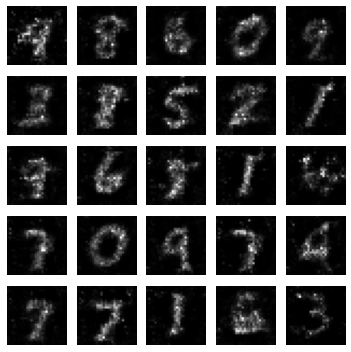


\epoch 921.000000 , ncv_G_Loss: 0.600203, cv_D_loss: 2.771779, cv_acc: 0.858100
Model saved

\epoch 922.000000 , ncv_G_Loss: 0.419307, cv_D_loss: 2.626625, cv_acc: 0.883500

\epoch 923.000000 , ncv_G_Loss: 0.753103, cv_D_loss: 2.939868, cv_acc: 0.840000

\epoch 924.000000 , ncv_G_Loss: 0.232891, cv_D_loss: 2.901044, cv_acc: 0.782600

\epoch 925.000000 , ncv_G_Loss: 0.281309, cv_D_loss: 2.752240, cv_acc: 0.851500

\epoch 926.000000 , ncv_G_Loss: 0.474540, cv_D_loss: 2.812109, cv_acc: 0.803700

\epoch 927.000000 , ncv_G_Loss: 0.950719, cv_D_loss: 3.167447, cv_acc: 0.852300

\epoch 928.000000 , ncv_G_Loss: 0.683224, cv_D_loss: 2.896523, cv_acc: 0.841400

\epoch 929.000000 , ncv_G_Loss: 0.583706, cv_D_loss: 2.842659, cv_acc: 0.749300

\epoch 930.000000 , ncv_G_Loss: 0.264579, cv_D_loss: 2.783609, cv_acc: 0.825800


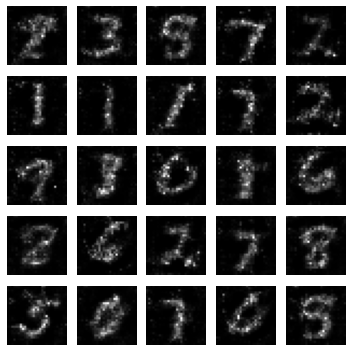


\epoch 931.000000 , ncv_G_Loss: 0.297362, cv_D_loss: 2.647960, cv_acc: 0.870600

\epoch 932.000000 , ncv_G_Loss: 0.772445, cv_D_loss: 2.927111, cv_acc: 0.861800

\epoch 933.000000 , ncv_G_Loss: 0.444075, cv_D_loss: 2.635502, cv_acc: 0.866500

\epoch 934.000000 , ncv_G_Loss: 0.252604, cv_D_loss: 2.658059, cv_acc: 0.878500

\epoch 935.000000 , ncv_G_Loss: 0.631166, cv_D_loss: 2.835007, cv_acc: 0.864700

\epoch 936.000000 , ncv_G_Loss: 0.273721, cv_D_loss: 2.962151, cv_acc: 0.733500

\epoch 937.000000 , ncv_G_Loss: 0.953015, cv_D_loss: 3.730921, cv_acc: 0.575100

\epoch 938.000000 , ncv_G_Loss: 0.316724, cv_D_loss: 2.616118, cv_acc: 0.873100

\epoch 939.000000 , ncv_G_Loss: 0.825716, cv_D_loss: 3.547316, cv_acc: 0.715400

\epoch 940.000000 , ncv_G_Loss: 0.439069, cv_D_loss: 2.564454, cv_acc: 0.876900


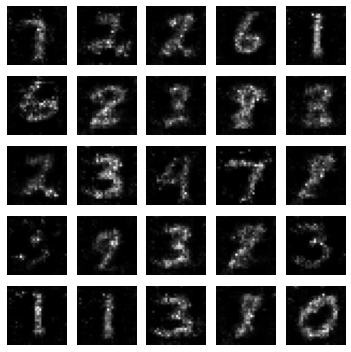


\epoch 941.000000 , ncv_G_Loss: 0.505381, cv_D_loss: 2.776617, cv_acc: 0.846500

\epoch 942.000000 , ncv_G_Loss: 0.491224, cv_D_loss: 2.663305, cv_acc: 0.881600

\epoch 943.000000 , ncv_G_Loss: 0.392406, cv_D_loss: 2.659547, cv_acc: 0.850300

\epoch 944.000000 , ncv_G_Loss: 0.485963, cv_D_loss: 2.601157, cv_acc: 0.872000

\epoch 945.000000 , ncv_G_Loss: 0.550110, cv_D_loss: 2.687813, cv_acc: 0.876000

\epoch 946.000000 , ncv_G_Loss: 0.673612, cv_D_loss: 2.888103, cv_acc: 0.852900

\epoch 947.000000 , ncv_G_Loss: 0.416508, cv_D_loss: 2.642076, cv_acc: 0.847800

\epoch 948.000000 , ncv_G_Loss: 0.660990, cv_D_loss: 2.898557, cv_acc: 0.860800

\epoch 949.000000 , ncv_G_Loss: 0.764539, cv_D_loss: 3.384047, cv_acc: 0.715800

\epoch 950.000000 , ncv_G_Loss: 0.224000, cv_D_loss: 3.043364, cv_acc: 0.726500


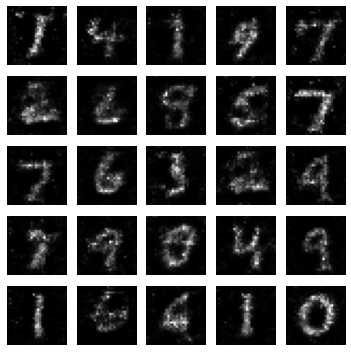


\epoch 951.000000 , ncv_G_Loss: 0.731366, cv_D_loss: 2.859397, cv_acc: 0.877900

\epoch 952.000000 , ncv_G_Loss: 0.783757, cv_D_loss: 3.072997, cv_acc: 0.860000

\epoch 953.000000 , ncv_G_Loss: 0.408949, cv_D_loss: 2.827381, cv_acc: 0.774100

\epoch 954.000000 , ncv_G_Loss: 0.323167, cv_D_loss: 2.656040, cv_acc: 0.846300

\epoch 955.000000 , ncv_G_Loss: 0.357640, cv_D_loss: 2.778997, cv_acc: 0.817000

\epoch 956.000000 , ncv_G_Loss: 0.766041, cv_D_loss: 3.013039, cv_acc: 0.852100

\epoch 957.000000 , ncv_G_Loss: 0.238633, cv_D_loss: 2.675394, cv_acc: 0.864800

\epoch 958.000000 , ncv_G_Loss: 0.475779, cv_D_loss: 2.632497, cv_acc: 0.870000

\epoch 959.000000 , ncv_G_Loss: 0.282273, cv_D_loss: 2.628086, cv_acc: 0.878200

\epoch 960.000000 , ncv_G_Loss: 0.678433, cv_D_loss: 3.531632, cv_acc: 0.531000


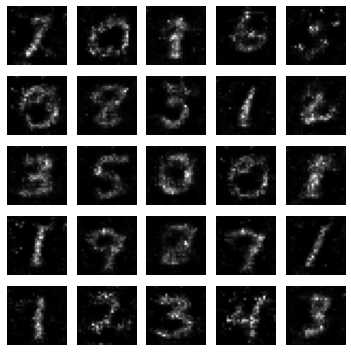


\epoch 961.000000 , ncv_G_Loss: 0.574534, cv_D_loss: 2.731445, cv_acc: 0.870000

\epoch 962.000000 , ncv_G_Loss: 0.493593, cv_D_loss: 2.596662, cv_acc: 0.867900

\epoch 963.000000 , ncv_G_Loss: 0.635993, cv_D_loss: 2.749325, cv_acc: 0.875000

\epoch 964.000000 , ncv_G_Loss: 0.480425, cv_D_loss: 2.761185, cv_acc: 0.821000

\epoch 965.000000 , ncv_G_Loss: 0.606586, cv_D_loss: 2.751420, cv_acc: 0.846600

\epoch 966.000000 , ncv_G_Loss: 0.458576, cv_D_loss: 3.011109, cv_acc: 0.731800

\epoch 967.000000 , ncv_G_Loss: 0.396554, cv_D_loss: 2.795660, cv_acc: 0.794700

\epoch 968.000000 , ncv_G_Loss: 0.444882, cv_D_loss: 2.839777, cv_acc: 0.812800

\epoch 969.000000 , ncv_G_Loss: 0.435887, cv_D_loss: 2.901475, cv_acc: 0.794600

\epoch 970.000000 , ncv_G_Loss: 0.713234, cv_D_loss: 2.852946, cv_acc: 0.851400


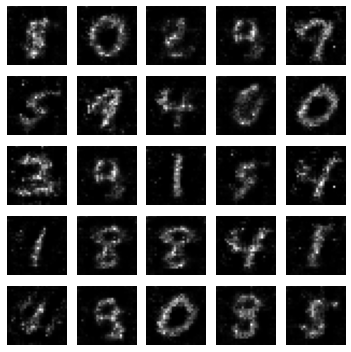


\epoch 971.000000 , ncv_G_Loss: 0.621270, cv_D_loss: 3.497801, cv_acc: 0.509300

\epoch 972.000000 , ncv_G_Loss: 0.587801, cv_D_loss: 2.833211, cv_acc: 0.836600

\epoch 973.000000 , ncv_G_Loss: 0.747788, cv_D_loss: 3.037533, cv_acc: 0.782600

\epoch 974.000000 , ncv_G_Loss: 0.251099, cv_D_loss: 2.980319, cv_acc: 0.747900

\epoch 975.000000 , ncv_G_Loss: 0.970836, cv_D_loss: 3.490312, cv_acc: 0.706500

\epoch 976.000000 , ncv_G_Loss: 0.420115, cv_D_loss: 2.865764, cv_acc: 0.771300

\epoch 977.000000 , ncv_G_Loss: 0.538728, cv_D_loss: 2.715633, cv_acc: 0.860600

\epoch 978.000000 , ncv_G_Loss: 0.629436, cv_D_loss: 2.808869, cv_acc: 0.823300

\epoch 979.000000 , ncv_G_Loss: 1.000834, cv_D_loss: 3.365312, cv_acc: 0.832900

\epoch 980.000000 , ncv_G_Loss: 0.917382, cv_D_loss: 3.589244, cv_acc: 0.605800


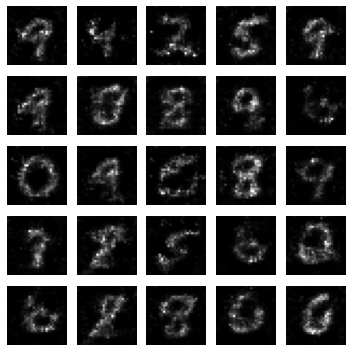


\epoch 981.000000 , ncv_G_Loss: 1.100047, cv_D_loss: 3.689466, cv_acc: 0.695600

\epoch 982.000000 , ncv_G_Loss: 0.458299, cv_D_loss: 2.742886, cv_acc: 0.839800

\epoch 983.000000 , ncv_G_Loss: 0.697614, cv_D_loss: 2.845092, cv_acc: 0.842000

\epoch 984.000000 , ncv_G_Loss: 0.485577, cv_D_loss: 2.614976, cv_acc: 0.880700

\epoch 985.000000 , ncv_G_Loss: 0.608839, cv_D_loss: 2.713704, cv_acc: 0.876900

\epoch 986.000000 , ncv_G_Loss: 0.582708, cv_D_loss: 2.803102, cv_acc: 0.855400

\epoch 987.000000 , ncv_G_Loss: 0.427499, cv_D_loss: 2.979910, cv_acc: 0.724500

\epoch 988.000000 , ncv_G_Loss: 0.963111, cv_D_loss: 3.137942, cv_acc: 0.875000

\epoch 989.000000 , ncv_G_Loss: 0.705504, cv_D_loss: 2.813721, cv_acc: 0.880400

\epoch 990.000000 , ncv_G_Loss: 0.831012, cv_D_loss: 3.084399, cv_acc: 0.836800


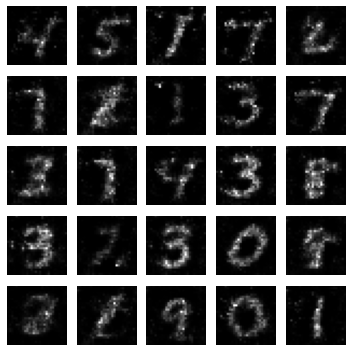


\epoch 991.000000 , ncv_G_Loss: 0.384967, cv_D_loss: 2.601944, cv_acc: 0.865900
Model saved

\epoch 992.000000 , ncv_G_Loss: 0.267856, cv_D_loss: 2.606314, cv_acc: 0.883700

\epoch 993.000000 , ncv_G_Loss: 0.593642, cv_D_loss: 2.899027, cv_acc: 0.828100

\epoch 994.000000 , ncv_G_Loss: 0.609785, cv_D_loss: 2.917523, cv_acc: 0.771100

\epoch 995.000000 , ncv_G_Loss: 0.630148, cv_D_loss: 3.210318, cv_acc: 0.726400

\epoch 996.000000 , ncv_G_Loss: 0.321478, cv_D_loss: 2.743773, cv_acc: 0.827000

\epoch 997.000000 , ncv_G_Loss: 0.962016, cv_D_loss: 3.215367, cv_acc: 0.857100

\epoch 998.000000 , ncv_G_Loss: 0.865067, cv_D_loss: 2.996580, cv_acc: 0.865200

\epoch 999.000000 , ncv_G_Loss: 0.374410, cv_D_loss: 2.658340, cv_acc: 0.856700

\epoch 1000.000000 , ncv_G_Loss: 1.175308, cv_D_loss: 4.182830, cv_acc: 0.515200


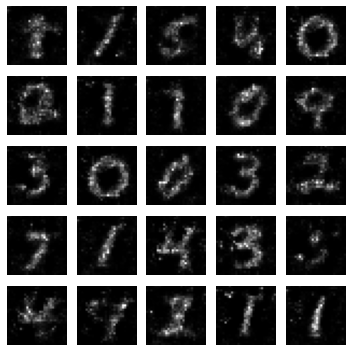

In [19]:
loss_acc = train_SSL_GAN(512, 1001)

In [0]:
train_D_losses, train_G_losses, train_Accs, cv_D_losses, cv_G_losses, cv_Accs = loss_acc

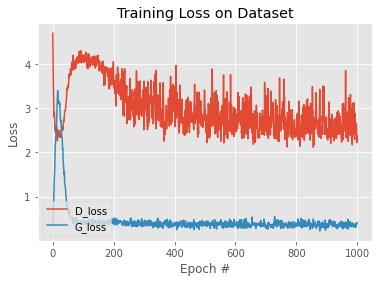

In [23]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, len(train_D_losses)), train_D_losses, label="D_loss")
plt.plot(np.arange(0, len(train_D_losses)), train_G_losses, label="G_loss")

plt.title("Training Loss on Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig("plot.png")